### Project created by Gauri Purandare

##### Import required libraries 

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

import string
import re

import nltk
from nltk.util import pr
from nltk.corpus import stopwords

import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

from textblob import TextBlob


stemmer = nltk.SnowballStemmer("english")
nltk.download('stopwords')
stopword=set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\anshul\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


##### Import the dataset

In [2]:
df = pd.read_csv("dataset.csv")

##### Display the information of the dataset

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24783 entries, 0 to 24782
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   index               24783 non-null  int64 
 1   count               24783 non-null  int64 
 2   hate_speech         24783 non-null  int64 
 3   offensive_language  24783 non-null  int64 
 4   neither             24783 non-null  int64 
 5   class               24783 non-null  int64 
 6   tweet               24783 non-null  object
dtypes: int64(6), object(1)
memory usage: 1.3+ MB


##### Assign labels to the classes 

In [4]:
df["labels"] = df["class"].map({0: "Derogatory Speech", 1: "Objectionable Language", 2: "No hatred shown"})

##### Display first 100 records

In [5]:
df.head(100)

,index,count,hate_speech,offensive_language,neither,class,tweet,labels
0,0,3,0,0,3,2,!!! RT @mayasolovely: As a woman you shouldn't...,No hatred shown
1,1,3,0,3,0,1,!!!!! RT @mleew17: boy dats cold...tyga dwn ba...,Objectionable Language
2,2,3,0,3,0,1,!!!!!!! RT @UrKindOfBrand Dawg!!!! RT @80sbaby...,Objectionable Language
3,3,3,0,2,1,1,!!!!!!!!! RT @C_G_Anderson: @viva_based she lo...,Objectionable Language
4,4,6,0,6,0,1,!!!!!!!!!!!!! RT @ShenikaRoberts: The shit you...,Objectionable Language
...,...,...,...,...,...,...,...,...
95,96,3,0,3,0,1,"""@CauseWereGuys: Going back to school sucks mo...",Objectionable Language
96,97,3,0,3,0,1,"""@CauseWereGuys: On my way to fuck yo bitch ht...",Objectionable Language
97,98,3,0,3,0,1,"""@CeleyNichole: @white_thunduh how come you ne...",Objectionable Language
98,99,3,0,3,0,1,"""@ChadMFVerbeck: If Richnow doesn't show up wi...",Objectionable Language


##### Plot a histrogram containing the number of tweets with respect to the labels assigned to them

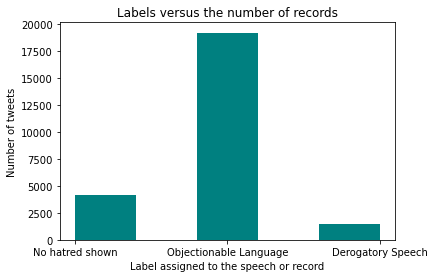

In [6]:
plt.hist(df['labels'], color = 'teal', bins =5)

plt.xlabel("Label assigned to the speech or record")
plt.ylabel("Number of tweets")
plt.title("Labels versus the number of records")

plt.show()

In [7]:
df['total_length_characters'] = df['tweet'].str.len()
print(df['total_length_characters'])

total_length_characters = df['total_length_characters'].sum()
print(total_length_characters)

count = 0
for y in df["tweet"]:
    count = count + 1
print(count)

average_length = total_length_characters / count
print (average_length)

0        140
1         85
2        120
3         62
4        137
        ... 
24778    146
24779     70
24780     67
24781     37
24782    127
Name: total_length_characters, Length: 24783, dtype: int64
2117155
24783
85.42771254488964


In [8]:
df['total_count_words'] = df['tweet'].str.split().str.len()
print(df['total_count_words'])

total_words = df['total_count_words'].sum()
print(total_words)

count = 0
for y in df["tweet"]:
    count = count + 1
print(count)

average_words = total_words / count
print (average_words)

0        25
1        16
2        21
3         9
4        26
         ..
24778    19
24779    13
24780    13
24781     7
24782    18
Name: total_count_words, Length: 24783, dtype: int64
349733
24783
14.111810515272566


###### Apply the library TextBlob

In [9]:
for i in df.index:
    print(TextBlob(df['tweet'].iloc[i]).ngrams(2))

[WordList(['RT', 'mayasolovely']), WordList(['mayasolovely', 'As']), WordList(['As', 'a']), WordList(['a', 'woman']), WordList(['woman', 'you']), WordList(['you', 'should']), WordList(['should', "n't"]), WordList(["n't", 'complain']), WordList(['complain', 'about']), WordList(['about', 'cleaning']), WordList(['cleaning', 'up']), WordList(['up', 'your']), WordList(['your', 'house']), WordList(['house', 'amp']), WordList(['amp', 'as']), WordList(['as', 'a']), WordList(['a', 'man']), WordList(['man', 'you']), WordList(['you', 'should']), WordList(['should', 'always']), WordList(['always', 'take']), WordList(['take', 'the']), WordList(['the', 'trash']), WordList(['trash', 'out'])]
[WordList(['RT', 'mleew17']), WordList(['mleew17', 'boy']), WordList(['boy', 'dats']), WordList(['dats', 'cold']), WordList(['cold', 'tyga']), WordList(['tyga', 'dwn']), WordList(['dwn', 'bad']), WordList(['bad', 'for']), WordList(['for', 'cuffin']), WordList(['cuffin', 'dat']), WordList(['dat', 'hoe']), WordList

[WordList(['Lipe_the_Great', '8220']), WordList(['8220', 'h0rheyd']), WordList(['h0rheyd', 'Lipe_the_Great']), WordList(['Lipe_the_Great', 'Shut']), WordList(['Shut', 'up']), WordList(['up', 'zoe']), WordList(['zoe', 'fight']), WordList(['fight', 'me']), WordList(['me', 'pussy']), WordList(['pussy', '8221']), WordList(['8221', 'for']), WordList(['for', 'zoe']), WordList(['zoe', 'I']), WordList(['I', "'m"]), WordList(["'m", 'good']), WordList(['good', 'man']), WordList(['man', 'You']), WordList(['You', 'are']), WordList(['are', 'good']), WordList(['good', "ma'am"]), WordList(["ma'am", 'Move']), WordList(['Move', 'along']), WordList(['along', 'now'])]
[WordList(['LolaaIsDope', 'Lmao']), WordList(['Lmao', 'fucking']), WordList(['fucking', 'snake']), WordList(['snake', 'bitches']), WordList(['bitches', 'em'])]
[WordList(['Loveable_Aizah', 'Big']), WordList(['Big', 'booty']), WordList(['booty', 'hoes']), WordList(['hoes', 'everywhere']), WordList(['everywhere', 'sheesh']), WordList(['sheesh

[WordList(['OOMEF', 'had']), WordList(['had', 'that']), WordList(['that', 'YEAH']), WordList(['YEAH', 'i']), WordList(['i', 'kno']), WordList(['kno', 'she']), WordList(['she', 'pussy']), WordList(['pussy', 'whipped']), WordList(['whipped', 'that']), WordList(['that', 'other']), WordList(['other', 'nigga']), WordList(['nigga', 'into']), WordList(['into', 'putting']), WordList(['putting', 'a']), WordList(['a', 'ring']), WordList(['ring', 'on']), WordList(['on', 'it']), WordList(['it', '128564']), WordList(['128564', '128564'])]
[WordList(['OnlyInAMichaelMyersMovie', 'bitch']), WordList(['bitch', 'is']), WordList(['is', 'running']), WordList(['running', 'a']), WordList(['a', 'hundred']), WordList(['hundred', 'meter']), WordList(['meter', 'dash']), WordList(['dash', 'on']), WordList(['on', 'this']), WordList(['this', 'niqqa']), WordList(['niqqa', 'WHOS']), WordList(['WHOS', 'ACTUALLY']), WordList(['ACTUALLY', 'TAKING']), WordList(['TAKING', 'HIS']), WordList(['HIS', 'TIME']), WordList(['TI

[WordList(['128520', '127383']), WordList(['127383', 'we']), WordList(['we', 'snap']), WordList(['snap', 'chatted']), WordList(['chatted', 'for']), WordList(['for', 'one']), WordList(['one', 'night']), WordList(['night', 'lol']), WordList(['lol', 'But']), WordList(['But', 'you']), WordList(['you', "'re"]), WordList(["'re", 'cute']), WordList(['cute', 'Snapchat']), WordList(['Snapchat', 'me']), WordList(['me', 'back']), WordList(['back', 'nig'])]
[WordList(['128520', '128525']), WordList(['128525', '128176']), WordList(['128176', 'your']), WordList(['your', 'my']), WordList(['my', 'BFFL']), WordList(['BFFL', 'I']), WordList(['I', 'love']), WordList(['love', 'you']), WordList(['you', 'ya']), WordList(['ya', 'funcy']), WordList(['funcy', 'bitch']), WordList(['bitch', '128514']), WordList(['128514', 'I']), WordList(['I', 'went']), WordList(['went', 'Finna']), WordList(['Finna', 'be']), WordList(['be', 'faded']), WordList(['faded', 'amp']), WordList(['amp', 'shaded']), WordList(['shaded', '

[WordList(['8220', 'Kik2Clean']), WordList(['Kik2Clean', 'Brah']), WordList(['Brah', 'Wiz']), WordList(['Wiz', 'cheated']), WordList(['cheated', '128514']), WordList(['128514', '128557']), WordList(['128557', 'http']), WordList(['http', 't.co/OZ2PnDNGJ0']), WordList(['t.co/OZ2PnDNGJ0', '8221']), WordList(['8221', 'she']), WordList(['she', 'had']), WordList(['had', 'hair']), WordList(['hair', 'like']), WordList(['like', 'a']), WordList(['a', 'dyke']), WordList(['dyke', 'Uh']), WordList(['Uh', 'Duh'])]
[WordList(['8220', 'KingDakkar']), WordList(['KingDakkar', 'These']), WordList(['These', 'hoes']), WordList(['hoes', 'out']), WordList(['out', 'of']), WordList(['of', 'control']), WordList(['control', 'https']), WordList(['https', 't.co/hZmf5maYva']), WordList(['t.co/hZmf5maYva', '8221']), WordList(['8221', 'LMFAOOO'])]
[WordList(['8220', 'King_SM']), WordList(['King_SM', 'If']), WordList(['If', 'Howard']), WordList(['Howard', 'elbow']), WordList(['elbow', 'bosh']), WordList(['bosh', 'will

[WordList(['8220', 'chrisbrazell']), WordList(['chrisbrazell', 'Fuck']), WordList(['Fuck', 'The']), WordList(['The', 'Girls']), WordList(['Girls', 'Peep']), WordList(['Peep', 'How']), WordList(['How', 'He']), WordList(['He', 'Change']), WordList(['Change', 'When']), WordList(['When', 'A']), WordList(['A', 'Nigga']), WordList(['Nigga', 'Squared']), WordList(['Squared', 'Up']), WordList(['Up', 'Against']), WordList(['Against', 'Him']), WordList(['Him', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', 'https']), WordList(['https', 't.co/FZx4ws7eeE']), WordList(['t.co/FZx4ws7eeE', '8221']), WordList(['8221', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', 'bitch']), WordList(['bitch', 'ass'])]
[WordList(['8220', 'getMEAUXmoney']), WordList(['getMEAUXmoney', 'Nobody']), WordList(['Nobody', 'cares']), Wo

[WordList(['8220', 'connycarvajal']), WordList(['connycarvajal', 'Why']), WordList(['Why', 'u']), WordList(['u', 'ca']), WordList(['ca', "n't"]), WordList(["n't", 'just']), WordList(['just', 'love']), WordList(['love', '8221']), WordList(['8221', 'Because']), WordList(['Because', 'we']), WordList(['we', 'do']), WordList(['do', "n't"]), WordList(["n't", 'love']), WordList(['love', 'these']), WordList(['these', 'hoes'])]
[WordList(['8220', 'cooney_mane']), WordList(['cooney_mane', 'BrianMC630']), WordList(['BrianMC630', 'they']), WordList(['they', 'played']), WordList(['played', 'a']), WordList(['a', 'great']), WordList(['great', 'job']), WordList(['job', 'who']), WordList(['who', "'s"]), WordList(["'s", 'the']), WordList(['the', 'retard']), WordList(['retard', 'now']), WordList(['now', '8221']), WordList(['8221', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514'])]
[WordList(['8220', 'creoleblood']), WordList(['creoleblood', '8220']), WordList(['8220', 'what_evait

[WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', 'GRAND']), WordList(['GRAND', 'OPENING']), WordList(['OPENING', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', 'TOP']), WordList(['TOP', 'CLASS']), WordList(['CLASS', '9733']), WordList(['9733', 'Oriental']), WordList(['Oriental', 'Massage']), WordList(['Massage', '9733']), WordList(['9733', 'PERFECT']), WordList(['PERFECT', '9733']), WordList(['9733', 'http']), WordList(['http', 't.co/K2iBFLgs4Z'])]
[WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', 'GRAND']), WordList(['GRAND', 'OPENING']), WordList(['OPENING', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', '9733']), WordList(['9733', 'TOP']), WordList(['TOP', 'CLASS']), 

[WordList(['Entertain', 'a']), WordList(['a', 'flirtin']), WordList(['flirtin', 'ass']), WordList(['ass', 'niggah']), WordList(['niggah', 'if']), WordList(['if', 'you']), WordList(['you', 'want']), WordList(['want', 'too']), WordList(['too', 'That']), WordList(['That', "'s"]), WordList(["'s", 'gon']), WordList(['gon', 'be']), WordList(['be', 'yo']), WordList(['yo', 'niggah']), WordList(['niggah', 'friendly']), WordList(['friendly', 'ass']), WordList(['ass', '9996']), WordList(['9996', '65039'])]
[WordList(['From', 'Freshman']), WordList(['Freshman', 'Year']), WordList(['Year', 'to']), WordList(['to', 'Senior']), WordList(['Senior', 'year']), WordList(['year', 'this']), WordList(['this', 'really']), WordList(['really', 'my']), WordList(['my', 'niggah']), WordList(['niggah', 'started']), WordList(['started', 'being']), WordList(['being', 'brothers']), WordList(['brothers', '4']), WordList(['4', 'years']), WordList(['years', 'ago']), WordList(['ago', 'TODAY']), WordList(['TODAY', 'It']), 

[WordList(['5:40', 'A.M']), WordList(['A.M', 'and']), WordList(['and', 'still']), WordList(['still', 'awake']), WordList(['awake', 'YAY']), WordList(['YAY', 'Time']), WordList(['Time', 'to']), WordList(['to', 'chug']), WordList(['chug', 'coffee']), WordList(['coffee', 'and']), WordList(['and', 'red']), WordList(['red', 'bull']), WordList(['bull', 'for']), WordList(['for', 'the']), WordList(['the', 'foreseeable']), WordList(['foreseeable', 'future']), WordList(['future', 'and']), WordList(['and', 'hopefully']), WordList(['hopefully', 'not']), WordList(['not', 'pass']), WordList(['pass', 'out']), WordList(['out', 'behind']), WordList(['behind', 'the']), WordList(['the', 'wheel'])]
[WordList(['5SOS', 'is']), WordList(['is', 'trash'])]
[WordList(['5am', 'Whizzing']), WordList(['Whizzing', 'crackers']), WordList(['crackers', 'My']), WordList(['My', 'cats']), WordList(['cats', 'got']), WordList(['got', 'into']), WordList(['into', 'the']), WordList(['the', 'Ritzcrackers']), WordList(['Ritzcra

[WordList(['1usagrunt', 'I']), WordList(['I', 'wonder']), WordList(['wonder', 'what']), WordList(['what', 'Charlie']), WordList(['Charlie', 'Brown']), WordList(['Brown', 'would']), WordList(['would', 'have']), WordList(['have', 'to']), WordList(['to', 'say']), WordList(['say', 'about']), WordList(['about', 'these']), WordList(['these', 'days'])]
[WordList(['2014samanthaKay', 'good']), WordList(['good', 'enough']), WordList(['enough', 'fag'])]
[WordList(['21Cvasquez', 'little']), WordList(['little', 'bitch']), WordList(['bitch', 'your']), WordList(['your', 'ass']), WordList(['ass', 'is']), WordList(['is', 'getting']), WordList(['getting', 'tased']), WordList(['tased', 'when']), WordList(['when', 'I']), WordList(['I', 'get']), WordList(['get', 'home'])]
[WordList(['22duces20', 'haha']), WordList(['haha', 'still']), WordList(['still', 'a']), WordList(['a', 'little']), WordList(['little', 'bitch']), WordList(['bitch', 'though']), WordList(['though', '128517'])]
[WordList(['253hippy', 'Bc']

[WordList(['Bojieasx', 'slap']), WordList(['slap', 'a']), WordList(['a', 'taco']), WordList(['taco', 'in']), WordList(['in', 'thT']), WordList(['thT', 'hoe']), WordList(['hoe', 'face']), WordList(['face', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', '9996']), WordList(['9996', '65039']), WordList(['65039', '128080']), WordList(['128080', '128074']), WordList(['128074', '128175']), WordList(['128175', '128536']), WordList(['128536', '128584']), WordList(['128584', '128129'])]
[WordList(['BolandDrummer', 'I']), WordList(['I', 'have']), WordList(['have', 'never']), WordList(['never', 'once']), WordList(['once', 'in']), WordList(['in', 'my']), WordList(['my', 'life']), WordList(['life', 'been']), WordList(['been', 'to']), WordList(['to', 'a']), WordList(['a', "'coffee"]), WordList(["'coffee", 'shop']), WordList(['shop', 'like']), WordList(['like', 'Starbucks']), WordList(['Starbucks', 'I']), WordList(['I', 'am']), WordList(['am', 'a']), Wo

[WordList(['CapoDaAssHole', 'I']), WordList(['I', 'fuck']), WordList(['fuck', 'with']), WordList(['with', 'Takeoff']), WordList(['Takeoff', 'nigga']), WordList(['nigga', 'get']), WordList(['get', 'on']), WordList(['on', 'the']), WordList(['the', 'bitch']), WordList(['bitch', 'and']), WordList(['and', 'just']), WordList(['just', 'snap'])]
[WordList(['CapoDaAssHole', 'lol']), WordList(['lol', 'that']), WordList(['that', 'hoe']), WordList(['hoe', 'for']), WordList(['for', '5yr']), WordList(['5yr', 'old'])]
[WordList(['CapoDaAssHole', 'naw']), WordList(['naw', 'where']), WordList(['where', 'can']), WordList(['can', 'I']), WordList(['I', 'see']), WordList(['see', 'that']), WordList(['that', 'hoe']), WordList(['hoe', 'at'])]
[WordList(['CapoDaAssHole', 'wiz']), WordList(['wiz', 'had']), WordList(['had', 'a']), WordList(['a', 'warrant']), WordList(['warrant', 'like']), WordList(['like', 'a']), WordList(['a', 'bitch'])]
[WordList(['CapoDaAssHole', 'yea']), WordList(['yea', 'he']), WordList(['h

[WordList(['DeeMayweather', 'the']), WordList(['the', 'fck']), WordList(['fck', 'dem']), WordList(['dem', 'bitches']), WordList(['bitches', 'always']), WordList(['always', 'got']), WordList(['got', 'sum']), WordList(['sum', 'shit']), WordList(['shit', 'wit']), WordList(['wit', 'them'])]
[WordList(['DeeRay_FRESH', 'pussy']), WordList(['pussy', 'amp']), WordList(['amp', 'purp']), WordList(['purp', '128514'])]
[WordList(['Deeiiggee', 'hey']), WordList(['hey', 'bitch']), WordList(['bitch', 'if']), WordList(['if', 'your']), WordList(['your', 'gon']), WordList(['gon', 'na']), WordList(['na', 'talk']), WordList(['talk', 'shit']), WordList(['shit', 'tag']), WordList(['tag', 'me']), WordList(['me', 'and']), WordList(['and', 'quit']), WordList(['quit', 'being']), WordList(['being', 'such']), WordList(['such', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'how']), WordList(['how', 'did']), WordList(['did', 'I']), WordList(['I', 'fuck']), WordList(['fuck', 'up']), WordList(['up', 'the']), Wo

[WordList(['Elvis_NotPresly', 'I']), WordList(['I', 'gt']), WordList(['gt', 'android']), WordList(['android', 'dmt']), WordList(['dmt', 'kno']), WordList(['kno', 'whats']), WordList(['whats', 'in']), WordList(['in', 'that']), WordList(['that', 'box']), WordList(['box', 'my']), WordList(['my', 'nig'])]
[WordList(['ElyssaJankowski', 'ComedyTextings']), WordList(['ComedyTextings', 'haha']), WordList(['haha', 'she']), WordList(['she', 'a']), WordList(['a', 'stupid']), WordList(['stupid', 'hoe'])]
[WordList(['EmmaLouisaSuttl', 'timmyn90']), WordList(['timmyn90', 'Anyone']), WordList(['Anyone', 'bring']), WordList(['bring', 'in']), WordList(['in', 'a']), WordList(['a', 'monkey'])]
[WordList(['EmmaLouisaSuttl', 'Hit']), WordList(['Hit', 'the']), WordList(['the', 'clam']), WordList(['clam', 'chowder.Thanks']), WordList(['chowder.Thanks', 'for']), WordList(['for', 'the']), WordList(['the', 'wishes']), WordList(['wishes', 'and']), WordList(['and', 'the']), WordList(['the', 'card'])]
[WordList(['

[WordList(['Hendrixoxo', 'lem']), WordList(['lem', 'me']), WordList(['me', 'guess']), WordList(['guess', 'you']), WordList(['you', 'wore']), WordList(['wore', 'the']), WordList(['the', 'hilly']), WordList(['hilly', 'hicks']), WordList(['hicks', 'sweats/leggings']), WordList(['sweats/leggings', '128514']), WordList(['128514', '128514']), WordList(['128514', '127874']), WordList(['127874', '127856']), WordList(['127856', '128079']), WordList(['128079', '127825'])]
[WordList(['Hendrixoxo', 'wtf']), WordList(['wtf', 'hoe']), WordList(['hoe', 'answer']), WordList(['answer', 'my']), WordList(['my', 'question'])]
[WordList(['Herfarm', 'SteveWorks4You']), WordList(['SteveWorks4You', 'TheDemocrats']), WordList(['TheDemocrats', 'your']), WordList(['your', 'low']), WordList(['low', 'info']), WordList(['info', 'redneck']), WordList(['redneck', 'dumbasses']), WordList(['dumbasses', 'vote']), WordList(['vote', 'for']), WordList(['for', 'these']), WordList(['these', 'corporate']), WordList(['corporat

[WordList(['IMNOTMAKINGITUP', 'Hey']), WordList(['Hey', 'u']), WordList(['u', 'just']), WordList(['just', 'followed']), WordList(['followed', 'me']), WordList(['me', 'not']), WordList(['not', 'long']), WordList(['long', 'ago']), WordList(['ago', 'Gon']), WordList(['Gon', 'na']), WordList(['na', 'nip']), WordList(['nip', 'that']), WordList(['that', 'in']), WordList(['in', 'da']), WordList(['da', 'bud']), WordList(['bud', 'like']), WordList(['like', 'ur']), WordList(['ur', 'bio']), WordList(['bio', 'tho']), WordList(['tho', 'U']), WordList(['U', 'know']), WordList(['know', 'the']), WordList(['the', 'white']), WordList(['white', 'devils']), WordList(['devils', 'stole']), WordList(['stole', 'our']), WordList(['our', 'our'])]
[WordList(['IMTHATGUY_DHuck', 'Happy']), WordList(['Happy', 'Birthday']), WordList(['Birthday', 'pussy']), WordList(['pussy', 'Have']), WordList(['Have', 'a']), WordList(['a', 'good']), WordList(['good', 'one'])]
[WordList(['ISmashedYoGurl', 'Jonathan_Scott']), WordLis

[WordList(['KILLQuana', 'lmao']), WordList(['lmao', 'cunt'])]
[WordList(['KINGDOMMINDED', 'lostb0y']), WordList(['lostb0y', 'fuck']), WordList(['fuck', 'off']), WordList(['off', 'my']), WordList(['my', 'pussy']), WordList(['pussy', 'boi']), WordList(['boi', 'bitch'])]
[WordList(['KINGDOMMINDED', 'lostb0y']), WordList(['lostb0y', 'me']), WordList(['me', 'bitch']), WordList(['bitch', 'im']), WordList(['im', 'tryna']), WordList(['tryna', 'keep']), WordList(['keep', 'a']), WordList(['a', 'clean']), WordList(['clean', 'track']), WordList(['track', 'record']), WordList(['record', 'the']), WordList(['the', 'fuck']), WordList(['fuck', 'bruh'])]
[WordList(['KINSL3Y', 'we']), WordList(['we', 'dont']), WordList(['dont', 'love']), WordList(['love', 'these']), WordList(['these', 'hoes'])]
[WordList(['KLSouth', 'Miss_Didi23']), WordList(['Miss_Didi23', 'is']), WordList(['is', 'an']), WordList(['an', 'evil']), WordList(['evil', 'hate']), WordList(['hate', 'whitey']), WordList(['whitey', 'racist']), W

[WordList(['KeyshawnSwag', 'on']), WordList(['on', 'god']), WordList(['god', 'niggaa']), WordList(['niggaa', 'be']), WordList(['be', 'tryna']), WordList(['tryna', 'say']), WordList(['say', 'aids']), WordList(['aids', 'been']), WordList(['been', 'out']), WordList(['out', 'longer']), WordList(['longer', 'and']), WordList(['and', 'shit']), WordList(['shit', 'like']), WordList(['like', 'no']), WordList(['no', 'bitch']), WordList(['bitch', 'Ebola']), WordList(['Ebola', 'been']), WordList(['been', 'out']), WordList(['out', 'here']), WordList(['here', '128514'])]
[WordList(['KeyshawnSwag', 'the']), WordList(['the', 'bad']), WordList(['bad', 'bitch']), WordList(['bitch', 'with']), WordList(['with', 'them']), WordList(['them', 'ugly']), WordList(['ugly', 'ass']), WordList(['ass', 'nikes'])]
[WordList(['KiKi_That_Seven', 'Lol']), WordList(['Lol', 'I']), WordList(['I', "'m"]), WordList(["'m", 'not']), WordList(['not', 'you']), WordList(['you', 'just']), WordList(['just', 'ca']), WordList(['ca', "

[WordList(['Miss_Didi23', 'LINDNLD']), WordList(['LINDNLD', 'KLSouth']), WordList(['KLSouth', 'shut']), WordList(['shut', 'up']), WordList(['up', 'you']), WordList(['you', 'nappy']), WordList(['nappy', 'headed']), WordList(['headed', 'hoe'])]
[WordList(['Missyy_J', 'happy']), WordList(['happy', 'birthday']), WordList(['birthday', 'bitch']), WordList(['bitch', '10084']), WordList(['10084', '65039']), WordList(['65039', '127881'])]
[WordList(['MisterDimmadome', 'spiked']), WordList(['spiked', 'that']), WordList(['that', 'bitch']), WordList(['bitch', 'damned']), WordList(['damned', 'nailed']), WordList(['nailed', 'her']), WordList(['her', 'down'])]
[WordList(['Misters206', 'You']), WordList(['You', 'look']), WordList(['look', 'like']), WordList(['like', 'a']), WordList(['a', 'monkey'])]
[WordList(['MistressOfSham', 'that']), WordList(['that', 'area']), WordList(['area', 'is']), WordList(['is', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'regardless']), WordList(['regardless', 'so'

[WordList(['Neeksbethatguy', 'I']), WordList(['I', "'m"]), WordList(["'m", 'signing']), WordList(['signing', 'up']), WordList(['up', 'and']), WordList(['and', 'it']), WordList(['it', "'s"]), WordList(["'s", 'ghetto']), WordList(['ghetto', 'as']), WordList(['as', 'fuck']), WordList(['fuck', 'lmaoo'])]
[WordList(['Negroizzle', 'AnastasiaPacana']), WordList(['AnastasiaPacana', 'IHeinz2012']), WordList(['IHeinz2012', 'R3lentlssTr0ll']), WordList(['R3lentlssTr0ll', 'M_Overture']), WordList(['M_Overture', 'i']), WordList(['i', 'trusted']), WordList(['trusted', 'you']), WordList(['you', 'queer']), WordList(['queer', 'cakes']), WordList(['cakes', 'wheres']), WordList(['wheres', 'the']), WordList(['the', 'passion']), WordList(['passion', 'she']), WordList(['she', 'made']), WordList(['made', 'me']), WordList(['me', 'do']), WordList(['do', 'it']), WordList(['it', 'dammit'])]
[WordList(['NehmeBazzi', 'DatBoyRayT']), WordList(['DatBoyRayT', 'that']), WordList(['that', 'kids']), WordList(['kids', 'a

[WordList(['RealNoth', 'no']), WordList(['no', 'wonder']), WordList(['wonder', 'your']), WordList(['your', 'career']), WordList(['career', 'is']), WordList(['is', 'in']), WordList(['in', 'the']), WordList(['the', 'dump']), WordList(['dump', 'that']), WordList(['that', "'s"]), WordList(["'s", 'where']), WordList(['where', 'trash']), WordList(['trash', 'like']), WordList(['like', 'you']), WordList(['you', 'belongs']), WordList(['belongs', 'Thanks']), WordList(['Thanks', 'to']), WordList(['to', 'greggutfeld']), WordList(['greggutfeld', 'for']), WordList(['for', 'pointing']), WordList(['pointing', 'out']), WordList(['out', 'your']), WordList(['your', 'true']), WordList(['true', 'colors'])]
[WordList(['RealPimpinKen', 'PimpinKendotnet']), WordList(['PimpinKendotnet', 'sell']), WordList(['sell', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'pussy']), WordList(['pussy', 'til']), WordList(['til', 'it']), WordList(['it', "'s"]), WordList(["'s", 'drip']), WordList(['drip', 'drop']), WordL

[WordList(['RubyFakhoury', 'Nyquil_Dreams']), WordList(['Nyquil_Dreams', 'guynamedjordan']), WordList(['guynamedjordan', 'lets']), WordList(['lets', 'not']), WordList(['not', 'forget']), WordList(['forget', 'the']), WordList(['the', 'fact']), WordList(['fact', 'that']), WordList(['that', 'everyone']), WordList(['everyone', 'and']), WordList(['and', 'their']), WordList(['their', 'mother']), WordList(['mother', 'has']), WordList(['has', 'yellow']), WordList(['yellow', 'fever'])]
[WordList(['RudyJay711', 'Asains']), WordList(['Asains', 'had']), WordList(['had', 'to']), WordList(['to', 'take']), WordList(['take', 'the']), WordList(['the', 'Wu']), WordList(['Wu', 'Tang']), WordList(['Tang', 'Clan']), WordList(['Clan', 'the']), WordList(['the', 'draft']), WordList(['draft', 'was']), WordList(['was', 'suppose']), WordList(['suppose', 'to']), WordList(['to', 'be']), WordList(['be', 'for']), WordList(['for', 'half']), WordList(['half', 'breed']), WordList(['breed', 'like']), WordList(['like', '

[WordList(['ThadIsReal', 'we']), WordList(['we', 'in']), WordList(['in', 'dis']), WordList(['dis', 'hoe']), WordList(['hoe', 'Imma']), WordList(['Imma', 'get']), WordList(['get', 'her']), WordList(['her', 'too']), WordList(['too', 'lmfaoooo'])]
[WordList(['ThankYouAriana', 'no']), WordList(['no', 'one']), WordList(['one', 'asked']), WordList(['asked', 'bitch'])]
[WordList(['That1guyJeff', 'Low']), WordList(['Low', 'blow']), WordList(['blow', 'cuntface']), WordList(['cuntface', 'How']), WordList(['How', 'many']), WordList(['many', 'times']), WordList(['times', 'the']), WordList(['the', 'Yanks']), WordList(['Yanks', 'beat']), WordList(['beat', 'us']), WordList(['us', 'in']), WordList(['in', 'the']), WordList(['the', 'playoffs']), WordList(['playoffs', 'these']), WordList(['these', 'last']), WordList(['last', '8']), WordList(['8', 'or']), WordList(['or', 'so']), WordList(['so', 'years'])]
[WordList(['That1guyJeff', 'bitch']), WordList(['bitch', 'please']), WordList(['please', 'Not']), Wor

[WordList(['ToWherever', 'yay']), WordList(['yay', 'im']), WordList(['im', 'a']), WordList(['a', 'whitey']), WordList(['whitey', '3'])]
[WordList(['ToddIrwin1', 'NFL']), WordList(['NFL', 'Forgetabout']), WordList(['Forgetabout', 'they']), WordList(['they', 'got']), WordList(['got', 'until']), WordList(['until', 'February']), WordList(['February', 'It']), WordList(['It', "'s"]), WordList(["'s", 'the']), WordList(['the', 'pennant']), WordList(['pennant', 'race']), WordList(['race', 'Let']), WordList(['Let', "'s"]), WordList(["'s", 'Go']), WordList(['Go', 'Yanks'])]
[WordList(['ToddKincannon', 'dywanwii']), WordList(['dywanwii', 'scotja2']), WordList(['scotja2', 'He']), WordList(['He', "'s"]), WordList(["'s", 'been']), WordList(['been', 'drinking']), WordList(['drinking', 'too']), WordList(['too', 'much']), WordList(['much', 'of']), WordList(['of', 'that']), WordList(['that', 'shitty']), WordList(['shitty', 'Canadian']), WordList(['Canadian', 'hoser']), WordList(['hoser', 'beer']), WordLi

[WordList(['Z_M_G', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514']), WordList(['128514', 'wow']), WordList(['wow', 'I']), WordList(['I', 'love']), WordList(['love', 'how']), WordList(['how', 'you']), WordList(['you', 'called']), WordList(['called', 'yourself']), WordList(['yourself', 'a']), WordList(['a', 'slut']), WordList(['slut', 'but']), WordList(['but', 'no']), WordList(['no', 'really']), WordList(['really', 'You']), WordList(['You', 'would']), WordList(['would', "n't"]), WordList(["n't", 'ever']), WordList(['ever', 'cheat']), WordList(['cheat', 'on']), WordList(['on', 'a']), WordList(['a', 'girl']), WordList(['girl', 'bitches']), WordList(['bitches', 'are']), WordList(['are', 'so']), WordList(['so', 'dumb'])]
[WordList(['Z_M_G', 'thirsty']), WordList(['thirsty', 'hoes']), WordList(['hoes', '128129'])]
[WordList(['ZachFulton72', 'they']), WordList(['they', 'got']), WordList(['got', 'some']),

[WordList(['illionaire', 'he']), WordList(['he', 'been']), WordList(['been', 'taking']), WordList(['taking', 'them']), WordList(['them', 'hoe']), WordList(['hoe', 'lol'])]
[WordList(['jeff_hank', 'lgreiner3']), WordList(['lgreiner3', 'RayceWarden']), WordList(['RayceWarden', 'BigJohn_Studd']), WordList(['BigJohn_Studd', 'shut']), WordList(['shut', 'up']), WordList(['up', 'nigger'])]
[WordList(['justlexis', 'lol']), WordList(['lol', 'whatever']), WordList(['whatever', 'We']), WordList(['We', "'re"]), WordList(["'re", 'fags'])]
[WordList(['lexisperez', 'he']), WordList(['he', 'ate']), WordList(['ate', 'my']), WordList(['my', 'pussy']), WordList(['pussy', 'i']), WordList(['i', 'could'])]
[WordList(['littlepuffin', 'I']), WordList(['I', 'just']), WordList(['just', 'saw']), WordList(['saw', 'a']), WordList(['a', 'bad']), WordList(['bad', 'bitch']), WordList(['bitch', 'on']), WordList(['on', 'here']), WordList(['here', 'from']), WordList(['from', 'mf']), WordList(['mf', 'Switzerland']), Word

[WordList(['benshapiro', 'just']), WordList(['just', 'more']), WordList(['more', 'teabagger']), WordList(['teabagger', 'babel']), WordList(['babel', 'these']), WordList(['these', 'are']), WordList(['are', 'the']), WordList(['the', 'same']), WordList(['same', 'fucks']), WordList(['fucks', 'that']), WordList(['that', 'masturbated']), WordList(['masturbated', 'to']), WordList(['to', 'TimTebow']), WordList(['TimTebow', 'they']), WordList(['they', 'just']), WordList(['just', 'HATE']), WordList(['HATE', 'it']), WordList(['it', 'when']), WordList(['when', 'gays']), WordList(['gays', 'r']), WordList(['r', 'successful'])]
[WordList(['bernadettvajda', 'they']), WordList(['they', 'always']), WordList(['always', 'put']), WordList(['put', 'gingers']), WordList(['gingers', 'in']), WordList(['in', 'red']), WordList(['red', 'yellow']), WordList(['yellow', 'or']), WordList(['or', 'leopard']), WordList(['leopard', 'print'])]
[WordList(['bestassbestface', 'omg']), WordList(['omg', 'ur']), WordList(['ur',

[WordList(['damnit_mannn', 'RoJustDGAF']), WordList(['RoJustDGAF', 'not']), WordList(['not', 'over']), WordList(['over', 'no']), WordList(['no', 'twitter']), WordList(['twitter', 'shit']), WordList(['shit', 'Plus']), WordList(['Plus', 'youre']), WordList(['youre', 'a']), WordList(['a', 'female']), WordList(['female', 'You']), WordList(['You', 'letting']), WordList(['letting', 'a']), WordList(['a', 'dumb']), WordList(['dumb', 'sloppy']), WordList(['sloppy', 'body']), WordList(['body', 'ignorant']), WordList(['ignorant', 'bitch']), WordList(['bitch', 'speak']), WordList(['speak', 'for']), WordList(['for', '13k']), WordList(['13k', 'people'])]
[WordList(['dan1ellep', 'And']), WordList(['And', 'they']), WordList(['they', '8217']), WordList(['8217', 're']), WordList(['re', 'retarded']), WordList(['retarded', 'as']), WordList(['as', 'fuck']), WordList(['fuck', 'in']), WordList(['in', 'general']), WordList(['general', 'with']), WordList(['with', 'their']), WordList(['their', '8220']), WordLis

[WordList(['gezus', 'MANIAC3X']), WordList(['MANIAC3X', 'Buckm00se']), WordList(['Buckm00se', 'but']), WordList(['but', 'Never']), WordList(['Never', 'to']), WordList(['to', 'moose']), WordList(['moose', 'lol']), WordList(['lol', 'log']), WordList(['log', 'off']), WordList(['off', 'faggot']), WordList(['faggot', 'your']), WordList(['your', 'finished'])]
[WordList(['gezus', 'MANIAC3X']), WordList(['MANIAC3X', 'bam00se']), WordList(['bam00se', 'Woody_AFC']), WordList(['Woody_AFC', 'mean']), WordList(['mean', 'bro']), WordList(['bro', 'fucking']), WordList(['fucking', 'faggot'])]
[WordList(['gezus', 'You']), WordList(['You', 'bitch']), WordList(['bitch', 'Come']), WordList(['Come', 'on']), WordList(['on', 'you']), WordList(['you', 'bitch']), WordList(['bitch', 'You']), WordList(['You', 'scared']), WordList(['scared', 'coward']), WordList(['coward', 'you']), WordList(['you', 'not']), WordList(['not', 'man']), WordList(['man', 'enough']), WordList(['enough', 'to']), WordList(['to', 'fuck'])

[WordList(['iank12', 'bitch'])]
[WordList(['icpchad', 'UnseeingEyes']), WordList(['UnseeingEyes', 'monkey']), WordList(['monkey', 'look']), WordList(['look', 'just']), WordList(['just', 'like']), WordList(['like', 'you'])]
[WordList(['idclogan', 'bad']), WordList(['bad', 'ass']), WordList(['ass', 'bitch'])]
[WordList(['idkconstancio', 'I']), WordList(['I', "'m"]), WordList(["'m", 'trash'])]
[WordList(['idochips', 'honky']), WordList(['honky', 'tonk']), WordList(['tonk', 'badonka']), WordList(['badonka', 'ankh'])]
[WordList(['iiAK', 'lmaoo']), WordList(['lmaoo', 'boy']), WordList(['boy', 'how']), WordList(['how', 'you']), WordList(['you', 'think']), WordList(['think', 'Benny']), WordList(['Benny', 'heard']), WordList(['heard', 'it']), WordList(['it', 'lol']), WordList(['lol', 'i']), WordList(['i', 'was']), WordList(['was', 'blasting']), WordList(['blasting', 'that']), WordList(['that', 'bitch'])]
[WordList(['iiAK', 'yea']), WordList(['yea', 'ima']), WordList(['ima', 'spin']), WordList([

[WordList(['kcSnowWhite7', 'SamSaunders42']), WordList(['SamSaunders42', 'do']), WordList(['do', "n't"]), WordList(["n't", 'forget']), WordList(['forget', 'nappy']), WordList(['nappy', 'headed']), WordList(['headed', 'butt']), WordList(['butt', 'ugly']), WordList(['ugly', 'bitch']), WordList(['bitch', 'who']), WordList(['who', "'s"]), WordList(["'s", 'married']), WordList(['married', 'to']), WordList(['to', 'a']), WordList(['a', 'Muslim'])]
[WordList(['keishagreyxxx', 'that']), WordList(['that', "'s"]), WordList(["'s", 'the']), WordList(['the', 'beauty']), WordList(['beauty', 'of']), WordList(['of', 'them']), WordList(['them', 'brownies']), WordList(['brownies', 'I']), WordList(['I', 'always']), WordList(['always', 'daydream']), WordList(['daydream', 'about']), WordList(['about', 'what']), WordList(['what', 'I']), WordList(['I', "'d"]), WordList(["'d", 'do']), WordList(['do', 'if']), WordList(['if', 'I']), WordList(['I', 'hit']), WordList(['hit', 'the']), WordList(['the', 'powerball'])

[WordList(['kingxxlopez', 'Lol']), WordList(['Lol', 'me']), WordList(['me', 'and']), WordList(['and', 'MarcusDenton']), WordList(['MarcusDenton', 'just']), WordList(['just', 'sit']), WordList(['sit', 'there']), WordList(['there', 'and']), WordList(['and', 'make']), WordList(['make', 'fun']), WordList(['fun', 'of']), WordList(['of', 'him']), WordList(['him', 'I']), WordList(['I', 'ca']), WordList(['ca', "n't"]), WordList(["n't", 'stand']), WordList(['stand', 'that']), WordList(['that', 'fag'])]
[WordList(['kingxxlopez', 'Roberts']), WordList(['Roberts', 'is']), WordList(['is', 'a']), WordList(['a', 'fuckin']), WordList(['fuckin', 'fag']), WordList(['fag', '128514']), WordList(['128514', 'smack']), WordList(['smack', 'the']), WordList(['the', 'shit']), WordList(['shit', 'outta']), WordList(['outta', 'him'])]
[WordList(['kinkymuslim', 'bitch']), WordList(['bitch', 'music'])]
[WordList(['kirbys08', 'James_Kirby']), WordList(['James_Kirby', 'fuck']), WordList(['fuck', 'you']), WordList(['yo

[WordList(['nightpurrowler', 'Oskzilla']), WordList(['Oskzilla', 'pussy']), WordList(['pussy', 'shit'])]
[WordList(['nightpurrowler', 'niggah']), WordList(['niggah', 'das']), WordList(['das', 'gay'])]
[WordList(['nikkiconner13', 'bellabelcastro']), WordList(['bellabelcastro', 'trippy']), WordList(['trippy', 'hoes']), WordList(['hoes', '127744']), WordList(['127744', '127744'])]
[WordList(['nkyathappala', 'I']), WordList(['I', "'m"]), WordList(["'m", 'gon']), WordList(['gon', 'na']), WordList(['na', 'drink']), WordList(['drink', 'monster']), WordList(['monster', 'til']), WordList(['til', 'I']), WordList(['I', 'sue']), WordList(['sue', 'we']), WordList(['we', 'gettin']), WordList(['gettin', 'the']), WordList(['the', 'bitch']), WordList(['bitch', 'GottaGetThe30'])]
[WordList(['noPOPULARity', 'lmaoo']), WordList(['lmaoo', 'one']), WordList(['one', 'nigga']), WordList(['nigga', 'had']), WordList(['had', 'that']), WordList(['that', '2nd']), WordList(['2nd', 'pic']), WordList(['pic', 'as']), 

[WordList(['prime3_time', 'whoooo']), WordList(['whoooo', 'Lem']), WordList(['Lem', 'me']), WordList(['me', 'find']), WordList(['find', 'out']), WordList(['out', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'run']), WordList(['run', 'u']), WordList(['u', 'haha'])]
[WordList(['princessfaggit', 'I']), WordList(['I', 'do']), WordList(['do', "n't"]), WordList(["n't", 'see']), WordList(['see', 'tears']), WordList(['tears', 'bitch'])]
[WordList(['princessfaggit', 'cry']), WordList(['cry', 'bitch'])]
[WordList(['princesshil21', 'if']), WordList(['if', 'you']), WordList(['you', 'hate']), WordList(['hate', 'men']), WordList(['men', 'so']), WordList(['so', 'much']), WordList(['much', 'why']), WordList(['why', 'you']), WordList(['you', 'trying']), WordList(['trying', 'to']), WordList(['to', 'look']), WordList(['look', 'like']), WordList(['like', 'one']), WordList(['one', 'Stupid']), WordList(['Stupid', 'little']), WordList(['little', 'cunt'])]
[WordList(['princessmorggan', 'yeah']), WordLi

[WordList(['terrorwatchusa', 'I']), WordList(['I', 'think']), WordList(['think', 'its']), WordList(['its', 'about']), WordList(['about', 'Whites']), WordList(['Whites', 'trying']), WordList(['trying', 'to']), WordList(['to', 'be']), WordList(['be', 'the']), WordList(['the', 'most']), WordList(['most', 'Blackish']), WordList(['Blackish', 'what']), WordList(['what', 'we']), WordList(['we', 'in']), WordList(['in', 'Socal']), WordList(['Socal', 'call']), WordList(['call', 'wiggers']), WordList(['wiggers', 'liberals']), WordList(['liberals', 'democrats'])]
[WordList(['tess_stepakoff', 'jetsnation6297']), WordList(['jetsnation6297', 'bitch']), WordList(['bitch', 'please']), WordList(['please', 'I']), WordList(['I', "'m"]), WordList(["'m", 'a']), WordList(['a', 'stud'])]
[WordList(['theBOSS_Leslie', 'I']), WordList(['I', 'did']), WordList(['did', "n't"]), WordList(["n't", 'tag']), WordList(['tag', 'you']), WordList(['you', 'negro']), WordList(['negro', 'lol'])]
[WordList(['theEricGlife', 'sta

[WordList(['tyg235', 'italian_montana']), WordList(['italian_montana', 'have']), WordList(['have', 'fun']), WordList(['fun', 'losing']), WordList(['losing', 'tonight']), WordList(['tonight', 'bitch'])]
[WordList(['tyler_smith55', 'your']), WordList(['your', 'talking']), WordList(['talking', 'to']), WordList(['to', 'every']), WordList(['every', 'hick']), WordList(['hick', 'in']), WordList(['in', 'San']), WordList(['San', 'Antonio']), WordList(['Antonio', 'I']), WordList(['I', 'ride']), WordList(['ride', 'with']), WordList(['with', 'a']), WordList(['a', 'big']), WordList(['big', '45']), WordList(['45', 'in']), WordList(['in', 'the']), WordList(['the', 'console'])]
[WordList(['tyler_wilde', 'As']), WordList(['As', 'in']), WordList(['in', 'throw']), WordList(['throw', 'birds']), WordList(['birds', 'with']), WordList(['with', 'long']), WordList(['long', 'pointy']), WordList(['pointy', 'beaks']), WordList(['beaks', 'at']), WordList(['at', 'you'])]
[WordList(['tyler_wilde', 'CH3BURASHKA']), W

[WordList(['A', 'random']), WordList(['random', 'am']), WordList(['am', 'scroll']), WordList(['scroll', 'lands']), WordList(['lands', 'me']), WordList(['me', 'here']), WordList(['here', 'RT']), WordList(['RT', 'HarryRelloFonte']), WordList(['HarryRelloFonte', 'Charlie']), WordList(['Charlie', 'horses']), WordList(['horses', 'durin']), WordList(['durin', 'sex']), WordList(['sex', 'just']), WordList(['just', 'simply']), WordList(['simply', 'means']), WordList(['means', 'you']), WordList(['you', 'did']), WordList(['did', "n't"]), WordList(["n't", 'drink']), WordList(['drink', 'enough']), WordList(['enough', 'water']), WordList(['water', 'that']), WordList(['that', 'day'])]
[WordList(['A', 'real']), WordList(['real', 'gangster']), WordList(['gangster', 'ass']), WordList(['ass', 'nigga']), WordList(['nigga', 'know']), WordList(['know', 'the']), WordList(['the', 'play']), WordList(['play', 'the']), WordList(['the', 'real']), WordList(['real', 'gangster']), WordList(['gangster', 'ass']), Word

[WordList(['All', 'd']), WordList(['d', 'messy']), WordList(['messy', 'hoes']), WordList(['hoes', 'sleep'])]
[WordList(['All', 'da']), WordList(['da', 'lil']), WordList(['lil', 'bald']), WordList(['bald', 'headed']), WordList(['headed', 'bitches']), WordList(['bitches', 'standn']), WordList(['standn', 'outside']), WordList(['outside', 'of']), WordList(['of', 'kevin']), WordList(['kevin', 'gates']), WordList(['gates', 'tryna']), WordList(['tryna', 'get']), WordList(['get', 'in']), WordList(['in', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514'])]
[WordList(['All', 'da']), WordList(['da', 'white']), WordList(['white', 'folk']), WordList(['folk', 'off']), WordList(['off', 'twitter']), WordList(['twitter', 'yet']), WordList(['yet', 'Da']), WordList(['Da', 'colored']), WordList(['colored', 'tweet']), WordList(['tweet', 'at']), WordList(['at', 'night']), WordList(['night', 'while']), WordList(['while', "y'all"]), WordList(["y'all", 'sleep']), WordList(['sleep', 'cuz'

[WordList(['As', 'always']), WordList(['always', 'Eli']), WordList(['Eli', 'has']), WordList(['has', 'the']), WordList(['the', 'stupid']), WordList(['stupid', 'hick']), WordList(['hick', 'hayseed']), WordList(['hayseed', 'look']), WordList(['look', 'on']), WordList(['on', 'his']), WordList(['his', 'face']), WordList(['face', 'Giants']), WordList(['Giants', 'fans']), WordList(['fans', 'kill']), WordList(['kill', 'yaselves']), WordList(['yaselves', 'it']), WordList(['it', "'s"]), WordList(["'s", 'gon']), WordList(['gon', 'na']), WordList(['na', 'be']), WordList(['be', 'a']), WordList(['a', '8230']), WordList(['8230', 'http']), WordList(['http', 't.co/JcYZzMKCfu'])]
[WordList(['As', 'good']), WordList(['good', 'as']), WordList(['as', 'Percy']), WordList(['Percy', 'Harvin']), WordList(['Harvin', 'and']), WordList(['and', 'Peyton']), WordList(['Peyton', 'on']), WordList(['on', 'the']), WordList(['the', 'same']), WordList(['same', 'team']), WordList(['team', 'sound']), WordList(['sound', '82

[WordList(['Been', 'a']), WordList(['a', 'while']), WordList(['while', 'since']), WordList(['since', 'it']), WordList(['it', "'s"]), WordList(["'s", 'just']), WordList(['just', 'been']), WordList(['been', 'me']), WordList(['me', 'solo']), WordList(['solo', 'at']), WordList(['at', 'the']), WordList(['the', 'crib']), WordList(['crib', 'feeling']), WordList(['feeling', 'kinda']), WordList(['kinda', 'lonely']), WordList(['lonely', 'like']), WordList(['like', 'a']), WordList(['a', 'hoe'])]
[WordList(['Been', 'hooping']), WordList(['hooping', 'all']), WordList(['all', 'day']), WordList(['day', 'tired']), WordList(['tired', 'than']), WordList(['than', 'bitch'])]
[WordList(['Been', 'schooling']), WordList(['schooling', 'these']), WordList(['these', 'bitches']), WordList(['bitches', 'since']), WordList(['since', '92']), WordList(['92', '128524'])]
[WordList(['Been', 'sleeping']), WordList(['sleeping', 'toooooo']), WordList(['toooooo', 'much']), WordList(['much', 'fuck']), WordList(['fuck', 'it'

[WordList(['Bruh', 'this']), WordList(['this', 'niggah']), WordList(['niggah', 'always']), WordList(['always', 'falls']), WordList(['falls', 'asleep']), WordList(['asleep', '128530']), WordList(['128530', '128529'])]
[WordList(['Bruh', 'went']), WordList(['went', 'so']), WordList(['so', 'hard']), WordList(['hard', 'on']), WordList(['on', 'that']), WordList(['that', 'bitch']), WordList(['bitch', 'he']), WordList(['he', 'deserves']), WordList(['deserves', 'pimp']), WordList(['pimp', 'of']), WordList(['of', 'the']), WordList(['the', 'year'])]
[WordList(['Bruh', 'Sasuke']), WordList(['Sasuke', 'and']), WordList(['and', 'Sakuras']), WordList(['Sakuras', 'daughter']), WordList(['daughter', 'gon']), WordList(['gon', 'na']), WordList(['na', 'be']), WordList(['be', 'a']), WordList(['a', 'bad']), WordList(['bad', 'Uchiha']), WordList(['Uchiha', 'bitch'])]
[WordList(['Bruh', 'pt']), WordList(['pt', '2']), WordList(['2', 'jaxon1114']), WordList(['jaxon1114', 'killed']), WordList(['killed', 'this']

[WordList(['Ca', "n't"]), WordList(["n't", 'wait']), WordList(['wait', 'to']), WordList(['to', 'see']), WordList(['see', 'my']), WordList(['my', 'bitch']), WordList(['bitch', 'dutchess'])]
[WordList(['Ca', "n't"]), WordList(["n't", 'worry']), WordList(['worry', 'bout']), WordList(['bout', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'that']), WordList(['that', 'ai']), WordList(['ai', "n't"]), WordList(["n't", 'worried']), WordList(['worried', 'bout']), WordList(['bout', 'me'])]
[WordList(['Cancel', 'that']), WordList(['that', 'bitch']), WordList(['bitch', 'like']), WordList(['like', 'NINOOO'])]
[WordList(['Cancel', 'that']), WordList(['that', 'hoe']), WordList(['hoe', 'SB_Nick']), WordList(['SB_Nick', 'It']), WordList(['It', 'ai']), WordList(['ai', "n't"]), WordList(["n't", 'nothing']), WordList(['nothing', 'to']), WordList(['to', 'cut']), WordList(['cut', 'that']), WordList(['that', 'b']), WordList(['b', 'tch']), WordList(['tch', 'off'])]
[WordList(['Cancer', 'is']), WordList([

[WordList(['Dad', 'Why']), WordList(['Why', 'are']), WordList(['are', 'your']), WordList(['your', 'eyes']), WordList(['eyes', 'so']), WordList(['so', 'red']), WordList(['red', 'Son']), WordList(['Son', 'I']), WordList(['I', 'smoked']), WordList(['smoked', 'weed']), WordList(['weed', 'Dad']), WordList(['Dad', 'Dad']), WordList(['Dad', 'Do']), WordList(['Do', "n't"]), WordList(["n't", 'lie']), WordList(['lie', 'to']), WordList(['to', 'me']), WordList(['me', 'you']), WordList(['you', 'were']), WordList(['were', 'crying']), WordList(['crying', 'because']), WordList(['because', 'you']), WordList(['you', 'are']), WordList(['are', 'a']), WordList(['a', 'faggot'])]
[WordList(['Daddy', 'cracker']), WordList(['cracker', 'and']), WordList(['and', 'a']), WordList(['a', 'few']), WordList(['few', 'bad']), WordList(['bad', 'bitches'])]
[WordList(['Dafuq', 'is']), WordList(['is', 'floppy']), WordList(['floppy', 'bird'])]
[WordList(['Daiya', 'Nagore']), WordList(['Nagore', 'gets']), WordList(['gets', '

[WordList(['Did', 'we']), WordList(['we', 'just']), WordList(['just', 'become']), WordList(['become', 'best']), WordList(['best', 'friends']), WordList(['friends', 'with']), WordList(['with', 'these']), WordList(['these', 'hoes']), WordList(['hoes', 'on']), WordList(['on', 'the']), WordList(['the', 'boat']), WordList(['boat', 'Well']), WordList(['Well', 'probably']), WordList(['probably', 'so']), WordList(['so', 'but']), WordList(['but', 'we']), WordList(['we', 'do']), WordList(['do', "n't"]), WordList(["n't", 'love']), WordList(['love', 'em']), WordList(['em', 'tho'])]
[WordList(['Did', 'you']), WordList(['you', 'all']), WordList(['all', 'hear']), WordList(['hear', 'this']), WordList(['this', 'bundy']), WordList(['bundy', 'redneck']), WordList(['redneck', 'Someone']), WordList(['Someone', 'should']), WordList(['should', 'show']), WordList(['show', 'him']), WordList(['him', 'how']), WordList(['how', 'niggas']), WordList(['niggas', 'play'])]
[WordList(['Did', 'you']), WordList(['you', '

[WordList(['Everybody', 'fucking']), WordList(['fucking', 'everybody']), WordList(['everybody', 'bitch']), WordList(['bitch', '128588']), WordList(['128588', '128168']), WordList(['128168', '128168']), WordList(['128168', '9996']), WordList(['9996', '65039']), WordList(['65039', '128080']), WordList(['128080', '128079']), WordList(['128079', '128078']), WordList(['128078', '128581']), WordList(['128581', 'everybody']), WordList(['everybody', 'with']), WordList(['with', 'the']), WordList(['the', 'shit']), WordList(['shit', 'that']), WordList(['that', "'s"]), WordList(["'s", 'LIFE']), WordList(['LIFE', '128165']), WordList(['128165', '128173'])]
[WordList(['Everybody', 'got']), WordList(['got', 'foreign']), WordList(['foreign', 'bitches']), WordList(['bitches', 'and']), WordList(['and', 'foreign']), WordList(['foreign', 'cars']), WordList(['cars', '128564']), WordList(['128564', '128564'])]
[WordList(['Everybody', 'got']), WordList(['got', 'some']), WordList(['some', 'to']), WordList(['t

[WordList(['Fucking', 'trash']), WordList(['trash', 'carmeloanthony'])]
[WordList(['Fucking', 'twat']), WordList(['twat', 'RT']), WordList(['RT', 'EchBhiKe']), WordList(['EchBhiKe', 'Xavi']), WordList(['Xavi', 'checking']), WordList(['checking', 'the']), WordList(['the', 'grass']), WordList(['grass', 'HAHA']), WordList(['HAHA', 'http']), WordList(['http', 't.co/hrHEyyoIrp'])]
[WordList(['Fucking', 'with']), WordList(['with', 'these']), WordList(['these', 'hoes']), WordList(['hoes', 'nigga']), WordList(['nigga', 'do']), WordList(['do', "n't"]), WordList(["n't", 'be']), WordList(['be', 'no']), WordList(['no', 'dumby'])]
[WordList(['Fuckkkk', 'this']), WordList(['this', 'faggot']), WordList(['faggot', 'commie']), WordList(['commie', 'http']), WordList(['http', 't.co/RD81TnCo4f'])]
[WordList(['Fuckkkkk', 'My']), WordList(['My', 'nig']), WordList(['nig', 'a']), WordList(['a', 'g']), WordList(['g', 'tho']), WordList(['tho', 'he']), WordList(['he', 'gon']), WordList(['gon', 'na']), WordList([

[WordList(['Got', 'this']), WordList(['this', 'bad']), WordList(['bad', 'Spanish']), WordList(['Spanish', 'bitch']), WordList(['bitch', '128514']), WordList(['128514', '128079']), WordList(['128079', '128076']), WordList(['128076', '128527']), WordList(['128527', '128536'])]
[WordList(['Got', 'to']), WordList(['to', '18']), WordList(['18', 'on']), WordList(['on', 'flappy']), WordList(['flappy', 'bird'])]
[WordList(['Got', 'to']), WordList(['to', '8']), WordList(['8', 'on']), WordList(['on', 'flappy']), WordList(['flappy', 'birds']), WordList(['birds', 'can']), WordList(['can', 'you']), WordList(['you', 'say']), WordList(['say', 'happiest']), WordList(['happiest', 'girl']), WordList(['girl', 'on']), WordList(['on', 'earth'])]
[WordList(['Got', 'uh']), WordList(['uh', 'bitch']), WordList(['bitch', 'dat']), WordList(['dat', 'set']), WordList(['set', 'it']), WordList(['it', 'off']), WordList(['off', 'like']), WordList(['like', 'Jada']), WordList(['Jada', 'Pickett']), WordList(['Pickett', '

[WordList(['Having', 'sex']), WordList(['sex', 'with']), WordList(['with', 'a']), WordList(['a', 'guy']), WordList(['guy', 'wont']), WordList(['wont', 'keep']), WordList(['keep', 'him']), WordList(['him', 'around']), WordList(['around', 'for']), WordList(['for', 'you']), WordList(['you', 'dumb']), WordList(['dumb', 'hoes']), WordList(['hoes', 'who']), WordList(['who', 'think']), WordList(['think', 'that']), WordList(['that', 'Theres']), WordList(['Theres', 'plenty']), WordList(['plenty', 'pussy']), WordList(['pussy', 'Just']), WordList(['Just', 'got']), WordList(['got', 'ta']), WordList(['ta', 'have']), WordList(['have', 'a']), WordList(['a', 'guy']), WordList(['guy', 'who']), WordList(['who', 'wont']), WordList(['wont', 'give']), WordList(['give', 'in'])]
[WordList(['Having', 'spent']), WordList(['spent', 'the']), WordList(['the', 'whole']), WordList(['whole', 'of']), WordList(['of', 'catching']), WordList(['catching', 'fire']), WordList(['fire', 'telling']), WordList(['telling', 'the

[WordList(['How', 'you']), WordList(['you', 'fucc']), WordList(['fucc', 'for']), WordList(['for', 'cash']), WordList(['cash', 'but']), WordList(['but', 'u']), WordList(['u', 'not']), WordList(['not', 'a']), WordList(['a', 'hoe']), WordList(['hoe', 'And']), WordList(['And', 'how']), WordList(['how', 'I']), WordList(['I', "'m"]), WordList(["'m", 'going']), WordList(['going', 'to']), WordList(['to', 'respect']), WordList(['respect', 'u']), WordList(['u', 'if']), WordList(['if', 'your']), WordList(['your', 'poccets']), WordList(['poccets', 'broke'])]
[WordList(['How', 'you']), WordList(['you', 'gone']), WordList(['gone', 'wife']), WordList(['wife', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'that']), WordList(['that', 'let']), WordList(['let', 'niggas']), WordList(['niggas', 'lick']), WordList(['lick', 'on']), WordList(['on', 'her']), WordList(['her', 'head']), WordList(['head', 'in']), WordList(['in', 'public'])]
[WordList(['How', 'you']), WordList(['you', 'gon']), WordList(['gon

[WordList(['I', 'ca']), WordList(['ca', "n't"]), WordList(["n't", 'believe']), WordList(['believe', 'this']), WordList(['this', 'nigga']), WordList(['nigga', 'told']), WordList(['told', 'me']), WordList(['me', 'to']), WordList(['to', 'put']), WordList(['put', 'nutella']), WordList(['nutella', 'on']), WordList(['on', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'before']), WordList(['before', 'you']), WordList(['you', 'eat']), WordList(['eat', 'her']), WordList(['her', 'out']), WordList(['out', 'wildnigga'])]
[WordList(['I', 'ca']), WordList(['ca', "n't"]), WordList(["n't", 'blow']), WordList(['blow', 'bubbles']), WordList(['bubbles', 'or']), WordList(['or', 'whistle']), WordList(['whistle', 'I']), WordList(['I', "'m"]), WordList(["'m", 'basically']), WordList(['basically', 'retarded'])]
[WordList(['I', 'ca']), WordList(['ca', "n't"]), WordList(["n't", 'entertain']), WordList(['entertain', 'these']), WordList(['these', 'hoes']), WordList(['hoes', 'or']), WordList(['or', 'these'])

[WordList(['I', 'got']), WordList(['got', 'so']), WordList(['so', 'many']), WordList(['many', 'horses']), WordList(['horses', 'all']), WordList(['all', 'the']), WordList(['the', 'hoes']), WordList(['hoes', 'say']), WordList(['say', 'that']), WordList(['that', 'its']), WordList(['its', 'gorgeous']), WordList(['gorgeous', 'In']), WordList(['In', 'tha']), WordList(['tha', 'air']), WordList(['air', 'dats']), WordList(['dats', 'where']), WordList(['where', 'my']), WordList(['my', 'doors']), WordList(['doors', 'issssss'])]
[WordList(['I', 'got']), WordList(['got', 'some']), WordList(['some', 'bitch']), WordList(['bitch', 'ass']), WordList(['ass', 'coworkers']), WordList(['coworkers', 'I']), WordList(['I', 'stay']), WordList(['stay', 'late']), WordList(['late', 'every']), WordList(['every', 'day']), WordList(['day', 'last']), WordList(['last', 'week']), WordList(['week', 'I']), WordList(['I', 'do']), WordList(['do', "n't"]), WordList(["n't", 'complain']), WordList(['complain', 'about']), Word

[WordList(['I', 'lied']), WordList(['lied', 'the']), WordList(['the', 'fair']), WordList(['fair', 'is']), WordList(['is', "n't"]), WordList(["n't", 'the']), WordList(['the', 'only']), WordList(['only', 'place']), WordList(['place', 'Reno']), WordList(['Reno', 'girls']), WordList(['girls', 'dress']), WordList(['dress', 'up']), WordList(['up', 'like']), WordList(['like', 'cowgirl']), WordList(['cowgirl', 'sluts']), WordList(['sluts', 'NITC']), WordList(['NITC', 'hash']), WordList(['hash', 'tag']), WordList(['tag', 'bitches'])]
[WordList(['I', 'like']), WordList(['like', 'Chinese']), WordList(['Chinese', 'buffets']), WordList(['buffets', 'but']), WordList(['but', 'I']), WordList(['I', 'hate']), WordList(['hate', 'all']), WordList(['all', 'the']), WordList(['the', 'chinks'])]
[WordList(['I', 'like']), WordList(['like', 'Rivers']), WordList(['Rivers', 'he']), WordList(['he', 'talks']), WordList(['talks', 'a']), WordList(['a', 'lot']), WordList(['lot', 'of']), WordList(['of', 'trash']), Word

[WordList(['I', 'plan']), WordList(['plan', 'on']), WordList(['on', 'eating']), WordList(['eating', 'this']), WordList(['this', 'entire']), WordList(['entire', 'motherfucking']), WordList(['motherfucking', 'pizza']), WordList(['pizza', 'I']), WordList(['I', 'just']), WordList(['just', 'ordered']), WordList(['ordered', 'like']), WordList(['like', 'a']), WordList(['a', 'mufucka']), WordList(['mufucka', 'bitch'])]
[WordList(['I', 'prefer']), WordList(['prefer', 'Jameis']), WordList(['Jameis', 'Winston']), WordList(['Winston', 'to']), WordList(['to', 'not']), WordList(['not', 'speak']), WordList(['speak', 'on']), WordList(['on', 'TV']), WordList(['TV', 'at']), WordList(['at', 'all']), WordList(['all', 'Damn']), WordList(['Damn', 'coon'])]
[WordList(['I', 'pull']), WordList(['pull', 'hoes']), WordList(['hoes', 'tx'])]
[WordList(['I', 'pull']), WordList(['pull', 'up']), WordList(['up', 'in']), WordList(['in', 'a']), WordList(['a', 'gim']), WordList(['gim', 'me']), WordList(['me', 'yo']), Wor

[WordList(['I', 'wan']), WordList(['wan', 'na']), WordList(['na', 'see']), WordList(['see', 'some']), WordList(['some', 'ass']), WordList(['ass', 'clapping']), WordList(['clapping', 'legs']), WordList(['legs', 'shaking']), WordList(['shaking', 'i']), WordList(['i', 'wan']), WordList(['wan', 'see']), WordList(['see', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'get']), WordList(['get', 'on']), WordList(['on', 'they']), WordList(['they', 'head']), WordList(['head', 'fa']), WordList(['fa', 'dese']), WordList(['dese', 'BEATs'])]
[WordList(['I', 'wan']), WordList(['wan', 'na']), WordList(['na', 'try']), WordList(['try', 'pot']), WordList(['pot', 'brownies'])]
[WordList(['I', 'want']), WordList(['want', 'Oreos']), WordList(['Oreos', 'Who']), WordList(['Who', 'can']), WordList(['can', 'help']), WordList(['help', 'me'])]
[WordList(['I', 'want']), WordList(['want', 'a']), WordList(['a', 'cowboy']), WordList(['cowboy', 'killer'])]
[WordList(['I', 'want']), WordList(['want', 'a']), WordLi

[WordList(['I', "'ll"]), WordList(["'ll", 'give']), WordList(['give', 'you']), WordList(['you', 'a']), WordList(['a', 'baby']), WordList(['baby', 'zebra']), WordList(['zebra', 'girl'])]
[WordList(['I', "'ll"]), WordList(["'ll", 'go']), WordList(['go', 'to']), WordList(['to', 'class']), WordList(['class', 'the']), WordList(['the', 'last']), WordList(['last', '30']), WordList(['30', 'minutes']), WordList(['minutes', 'of']), WordList(['of', 'that']), WordList(['that', 'hoe'])]
[WordList(['I', "'ll"]), WordList(["'ll", 'have']), WordList(['have', 'these']), WordList(['these', 'bitches']), WordList(['bitches', 'havin']), WordList(['havin', 'baby']), WordList(['baby', "'s"]), WordList(["'s", 'every']), WordList(['every', 'week'])]
[WordList(['I', "'ll"]), WordList(["'ll", 'keep']), WordList(['keep', 'all']), WordList(['all', 'comments']), WordList(['comments', 'to']), WordList(['to', 'myself']), WordList(['myself', 'about']), WordList(['about', 'tho']), WordList(['tho', 'I']), WordList(['I',

[WordList(['I', "'m"]), WordList(["'m", 'roasting']), WordList(['roasting', 'the']), WordList(['the', 'first']), WordList(['first', 'one']), WordList(['one', 'of']), WordList(['of', 'my']), WordList(['my', 'niccas']), WordList(['niccas', 'who']), WordList(['who', 'rock']), WordList(['rock', 'them']), WordList(['them', 'shits'])]
[WordList(['I', "'m"]), WordList(["'m", 'saying']), WordList(['saying', 'though']), WordList(['though', '128514']), WordList(['128514', '128514']), WordList(['128514', '128553']), WordList(['128553', '128553']), WordList(['128553', 'RT']), WordList(['RT', 'bria']), WordList(['bria', 'all']), WordList(['all', 'my']), WordList(['my', 'panties']), WordList(['panties', 'be']), WordList(['be', 'vs']), WordList(['vs', 'ion']), WordList(['ion', 'look']), WordList(['look', 'like']), WordList(['like', 'these']), WordList(['these', 'bitches']), WordList(['bitches', 'tho'])]
[WordList(['I', "'m"]), WordList(["'m", 'seeing']), WordList(['seeing', 'more']), WordList(['more'

[WordList(['If', 'her']), WordList(['her', 'mom']), WordList(['mom', 'was/is']), WordList(['was/is', 'a']), WordList(['a', 'hoe']), WordList(['hoe', 'then']), WordList(['then', 'she']), WordList(['she', "'s"]), WordList(["'s", 'most']), WordList(['most', 'likely']), WordList(['likely', 'a']), WordList(['a', 'hoe']), WordList(['hoe', 'too']), WordList(['too', 'Where']), WordList(['Where', 'do']), WordList(['do', 'you']), WordList(['you', 'think']), WordList(['think', 'she']), WordList(['she', 'learned']), WordList(['learned', 'it']), WordList(['it', 'from'])]
[WordList(['If', 'i']), WordList(['i', 'aint']), WordList(['aint', 'hit']), WordList(['hit', 'that']), WordList(['that', 'bitch']), WordList(['bitch', 'then']), WordList(['then', 'i']), WordList(['i', 'aint']), WordList(['aint', 'hit']), WordList(['hit', 'that']), WordList(['that', 'bitch']), WordList(['bitch', 'why']), WordList(['why', 'lie']), WordList(['lie', 'about']), WordList(['about', 'it']), WordList(['it', 'thats']), WordL

[WordList(['If', 'your']), WordList(['your', 'parents']), WordList(['parents', 'let']), WordList(['let', 'you']), WordList(['you', 'drink']), WordList(['drink', 'underage']), WordList(['underage', 'they']), WordList(['they', "'re"]), WordList(["'re", 'fucking']), WordList(['fucking', 'retarded']), WordList(['retarded', 'and']), WordList(['and', 'so']), WordList(['so', 'are']), WordList(['are', 'you'])]
[WordList(['If', 'your']), WordList(['your', 'pussy']), WordList(['pussy', 'stink']), WordList(['stink', 'you']), WordList(['you', 'aint']), WordList(['aint', 'goin']), WordList(['goin', 'to']), WordList(['to', 'heaven'])]
[WordList(['If', 'your']), WordList(['your', 'twitter']), WordList(['twitter', 'is']), WordList(['is', 'private']), WordList(['private', 'but']), WordList(['but', 'your']), WordList(['your', 'Instagram']), WordList(['Instagram', 'is']), WordList(['is', 'public']), WordList(['public', 'u']), WordList(['u', 'r']), WordList(['r', 'probs']), WordList(['probs', 'a']), WordL

[WordList(['Its', 'true']), WordList(['true', 'though']), WordList(['though', 'lol']), WordList(['lol', 'RT']), WordList(['RT', 'jwill252']), WordList(['jwill252', '8220']), WordList(['8220', 'No85er_inMe']), WordList(['No85er_inMe', 'If']), WordList(['If', 'your']), WordList(['your', 'girl']), WordList(['girl', 'think']), WordList(['think', 'about']), WordList(['about', 'you']), WordList(['you', 'amp']), WordList(['amp', 'you']), WordList(['you', 'do']), WordList(['do', "n't"]), WordList(["n't", 'make']), WordList(['make', 'her']), WordList(['her', 'pussy']), WordList(['pussy', 'jump']), WordList(['jump', 'you']), WordList(['you', 'ai']), WordList(['ai', "n't"]), WordList(["n't", 'shit']), WordList(['shit', 'brah']), WordList(['brah', '8221']), WordList(['8221', 'lls'])]
[WordList(['Its', 'uno']), WordList(['uno', 'shawty']), WordList(['shawty', 'id']), WordList(['id', 'drop']), WordList(['drop', 'my']), WordList(['my', 'imaginary']), WordList(['imaginary', 'hoes']), WordList(['hoes',

[WordList(['Let', "'s"]), WordList(["'s", 'play']), WordList(['play', 'What']), WordList(['What', 'will']), WordList(['will', 'the']), WordList(['the', 'ghetto']), WordList(['ghetto', 'white']), WordList(['white', 'girl']), WordList(['girl', 'with']), WordList(['with', 'neck']), WordList(['neck', 'tattoos']), WordList(['tattoos', 'in']), WordList(['in', 'front']), WordList(['front', 'of']), WordList(['of', 'me']), WordList(['me', 'buy']), WordList(['buy', 'If']), WordList(['If', 'you']), WordList(['you', 'answered']), WordList(['answered', 'Cigarillo']), WordList(['Cigarillo', "'s"]), WordList(["'s", 'you']), WordList(['you', "'ve"]), WordList(["'ve", 'seen']), WordList(['seen', 'this']), WordList(['this', 'episode']), WordList(['episode', 'b4'])]
[WordList(['Let', "'s"]), WordList(["'s", 'run']), WordList(['run', 'a']), WordList(['a', 'train']), WordList(['train', 'on']), WordList(['on', 'this']), WordList(['this', 'bitch'])]
[WordList(['Let', "'s"]), WordList(["'s", 'see']), WordList

[WordList(['Mom', 'really']), WordList(['really', 'came']), WordList(['came', 'in']), WordList(['in', 'and']), WordList(['and', 'found']), WordList(['found', 'anything']), WordList(['anything', 'possible']), WordList(['possible', 'to']), WordList(['to', 'bitch']), WordList(['bitch', 'about'])]
[WordList(['Mom', 'said']), WordList(['said', 'I']), WordList(['I', 'could']), WordList(['could', "n't"]), WordList(["n't", 'have']), WordList(['have', 'chocolate']), WordList(['chocolate', 'milk']), WordList(['milk', 'past']), WordList(['past', 'nine']), WordList(['nine', 'so']), WordList(['so', 'I']), WordList(['I', 'punched']), WordList(['punched', 'that']), WordList(['that', 'bitch']), WordList(['bitch', 'in']), WordList(['in', 'the']), WordList(['the', 'pussy']), WordList(['pussy', 'satan']), WordList(['satan', '128526'])]
[WordList(['Mom', 'you']), WordList(['you', "'ve"]), WordList(["'ve", 'been']), WordList(['been', 'a']), WordList(['a', 'real']), WordList(['real', 'bitch']), WordList(['b

[WordList(['Nigga', 'was']), WordList(['was', 'sweating']), WordList(['sweating', 'like']), WordList(['like', 'a']), WordList(['a', 'guilty']), WordList(['guilty', 'preacher']), WordList(['preacher', 'in']), WordList(['in', 'that']), WordList(['that', 'bitch'])]
[WordList(['Nigga', 'you']), WordList(['you', 'a']), WordList(['a', 'pussy']), WordList(['pussy', 'hope']), WordList(['hope', 'you']), WordList(['you', 'got']), WordList(['got', '9']), WordList(['9', 'lives'])]
[WordList(['Nigga', 'you']), WordList(['you', 'is']), WordList(['is', 'a']), WordList(['a', 'fool']), WordList(['fool', '128553']), WordList(['128553', '8220']), WordList(['8220', 'BOSSMANRAN']), WordList(['BOSSMANRAN', 'I']), WordList(['I', 'feel']), WordList(['feel', 'like']), WordList(['like', 'eatin']), WordList(['eatin', 'nd']), WordList(['nd', 'beatin']), WordList(['beatin', 'a']), WordList(['a', 'pussy']), WordList(['pussy', 'up']), WordList(['up', '128553']), WordList(['128553', '8221'])]
[WordList(['Nigga', 'you

[WordList(['People', 'talk']), WordList(['talk', 'shit']), WordList(['shit', 'on']), WordList(['on', 'Twitter']), WordList(['Twitter', 'but']), WordList(['but', 'when']), WordList(['when', 'they']), WordList(['they', 'see']), WordList(['see', 'you']), WordList(['you', 'in']), WordList(['in', 'person']), WordList(['person', 'be']), WordList(['be', 'looking']), WordList(['looking', 'Like']), WordList(['Like', 'bitch']), WordList(['bitch', 'wtf']), WordList(['wtf', 'you']), WordList(['you', 'looking']), WordList(['looking', 'at']), WordList(['at', 'Yes']), WordList(['Yes', 'its']), WordList(['its', 'me']), WordList(['me', 'yeah']), WordList(['yeah', 'I']), WordList(['I', "'m"]), WordList(["'m", 'cute'])]
[WordList(['People', 'tend']), WordList(['tend', 'to']), WordList(['to', 'bitch']), WordList(['bitch', 'about']), WordList(['about', 'coaching']), WordList(['coaching', 'too']), WordList(['too', 'much']), WordList(['much', 'but']), WordList(['but', 'offensive']), WordList(['offensive', 'p

[WordList(['RT', 'AssholeOfDaYear']), WordList(['AssholeOfDaYear', 'Always']), WordList(['Always', 'a']), WordList(['a', 'bit']), WordList(['bit', 'of']), WordList(['of', 'irony']), WordList(['irony', 'in']), WordList(['in', 'the']), WordList(['the', 'air']), WordList(['air', 'when']), WordList(['when', 'chicks']), WordList(['chicks', 'call']), WordList(['call', 'strippers']), WordList(['strippers', 'hoes']), WordList(['hoes', 'then']), WordList(['then', 'grind']), WordList(['grind', 'on']), WordList(['on', 'yo']), WordList(['yo', 'dick']), WordList(['dick', '4']), WordList(['4', 'free']), WordList(['free', 'to']), WordList(['to', 'the']), WordList(['the', 'same']), WordList(['same', 'song']), WordList(['song', 'stri'])]
[WordList(['RT', 'AssholeOfDaYear']), WordList(['AssholeOfDaYear', 'Beyonce']), WordList(['Beyonce', 'made']), WordList(['made', 'too']), WordList(['too', 'many']), WordList(['many', 'hoodrat']), WordList(['hoodrat', 'anthems']), WordList(['anthems', 'to']), WordList([

[WordList(['RT', 'CHlLDHOODRUINER']), WordList(['CHlLDHOODRUINER', 'she']), WordList(['she', 'taught']), WordList(['taught', 'these']), WordList(['these', 'hoes']), WordList(['hoes', 'how']), WordList(['how', 'to']), WordList(['to', 'pose']), WordList(['pose', 'http']), WordList(['http', 't.co/aiObO34baA'])]
[WordList(['RT', 'CHlLDHOODRUINER']), WordList(['CHlLDHOODRUINER', 'taking']), WordList(['taking', 'out']), WordList(['out', 'the']), WordList(['the', 'trash']), WordList(['trash', 'at']), WordList(['at', 'night']), WordList(['night', 'http']), WordList(['http', 't.co/UhXTOgP4jZ'])]
[WordList(['RT', 'CHlLDHOODRUINER']), WordList(['CHlLDHOODRUINER', 'when']), WordList(['when', 'u']), WordList(['u', 'deep']), WordList(['deep', 'in']), WordList(['in', 'the']), WordList(['the', 'pussy']), WordList(['pussy', 'http']), WordList(['http', 't.co/0uFAhhYrUe'])]
[WordList(['RT', 'CHlLDHOODRUINER']), WordList(['CHlLDHOODRUINER', 'who']), WordList(['who', 'else']), WordList(['else', 'hated']), 

[WordList(['RT', 'CurrenSy_Spitta']), WordList(['CurrenSy_Spitta', 'Some']), WordList(['Some', 'bitches']), WordList(['bitches', 'think']), WordList(['think', 'a']), WordList(['a', 'trucker']), WordList(['trucker', 'hat']), WordList(['hat', 'automatically']), WordList(['automatically', 'makes']), WordList(['makes', 'them']), WordList(['them', 'a']), WordList(['a', 'model'])]
[WordList(['RT', 'Curvables']), WordList(['Curvables', 'She']), WordList(['She', 'play']), WordList(['play', 'Quarterback']), WordList(['Quarterback', 'and']), WordList(['and', 'got']), WordList(['got', 'a']), WordList(['a', 'cheerleader']), WordList(['cheerleader', 'girlfriend']), WordList(['girlfriend', 'YUPP']), WordList(['YUPP', 'this']), WordList(['this', 'hoe']), WordList(['hoe', 'more']), WordList(['more', 'of']), WordList(['of', 'a']), WordList(['a', 'man']), WordList(['man', 'than']), WordList(['than', 'I']), WordList(['I', "'ll"]), WordList(["'ll", 'ever']), WordList(['ever', 'be']), WordList(['be', 'http

[WordList(['RT', 'GuiltyZoE']), WordList(['GuiltyZoE', '128514']), WordList(['128514', 'benzino']), WordList(['benzino', 'bitch']), WordList(['bitch', 'was']), WordList(['was', "n't"]), WordList(["n't", 'ready']), WordList(['ready', '128557']), WordList(['128557', '128557']), WordList(['128557', '127821'])]
[WordList(['RT', 'Guinness_RAS']), WordList(['Guinness_RAS', 'chelsea_elisa']), WordList(['chelsea_elisa', 'tell']), WordList(['tell', 'him']), WordList(['him', 'that']), WordList(['that', 'you']), WordList(['you', 'chose']), WordList(['chose', 'A']), WordList(['A', 'not']), WordList(['not', 'to']), WordList(['to', 'trash']), WordList(['trash', 'the']), WordList(['the', 'environment']), WordList(['environment', 'while']), WordList(['while', 'trying']), WordList(['trying', 'to']), WordList(['to', 'save']), WordList(['save', 'it']), WordList(['it', 'like']), WordList(['like', 'a']), WordList(['a', 'hypocritical']), WordList(['hypocritical', 'douc']), WordList(['douc', '8230'])]
[WordL

[WordList(['RT', 'JayonnaZarate']), WordList(['JayonnaZarate', 'She']), WordList(['She', 'my']), WordList(['my', 'Lowkey']), WordList(['Lowkey', 'bitch']), WordList(['bitch', 'the']), WordList(['the', 'one']), WordList(['one', 'I']), WordList(['I', 'ride']), WordList(['ride', 'Lowkey']), WordList(['Lowkey', 'with'])]
[WordList(['RT', 'Jaystuh72']), WordList(['Jaystuh72', '8220']), WordList(['8220', '187XO']), WordList(['187XO', 'Not']), WordList(['Not', 'playen']), WordList(['playen', 'that']), WordList(['that', 'side']), WordList(['side', 'niggah']), WordList(['niggah', 'shit']), WordList(['shit', 'with']), WordList(['with', 'mine']), WordList(['mine', '8221']), WordList(['8221', 'omm'])]
[WordList(['RT', 'JayyMfCarter']), WordList(['JayyMfCarter', 'If']), WordList(['If', 'you']), WordList(['you', 'got']), WordList(['got', 'ta']), WordList(['ta', 'nigga']), WordList(['nigga', 'or']), WordList(['or', 'bitch']), WordList(['bitch', 'PLEASE']), WordList(['PLEASE', 'STAY']), WordList(['STA

[WordList(['RT', 'Manstagram']), WordList(['Manstagram', 'This']), WordList(['This', 'bitch']), WordList(['bitch', 'went']), WordList(['went', 'full']), WordList(['full', 'on']), WordList(['on', 'retard']), WordList(['retard', 'http']), WordList(['http', 't.co/nXj4QqGMx2'])]
[WordList(['RT', 'Manstagram']), WordList(['Manstagram', 'When']), WordList(['When', 'I']), WordList(['I', 'make']), WordList(['make', 'the']), WordList(['the', 'paper']), WordList(['paper', 'ball']), WordList(['ball', 'into']), WordList(['into', 'the']), WordList(['the', 'trash']), WordList(['trash', 'can']), WordList(['can', 'http']), WordList(['http', 't.co/m90W9N1zbT'])]
[WordList(['RT', 'Manstagram']), WordList(['Manstagram', 'When']), WordList(['When', 'your']), WordList(['your', 'trying']), WordList(['trying', 'to']), WordList(['to', 'resist']), WordList(['resist', 'the']), WordList(['the', 'urge']), WordList(['urge', 'to']), WordList(['to', 'smack']), WordList(['smack', 'a']), WordList(['a', 'bitch']), Word

[WordList(['RT', 'ParadoxicalMike']), WordList(['ParadoxicalMike', 'I']), WordList(['I', "'m"]), WordList(["'m", 'a']), WordList(['a', 'tramp']), WordList(['tramp', 'ho']), WordList(['ho', 'AND']), WordList(['AND', 'a']), WordList(['a', 'slut'])]
[WordList(['RT', 'ParisBurned']), WordList(['ParisBurned', 'When']), WordList(['When', 'they']), WordList(['they', 'run']), WordList(['run', 'out']), WordList(['out', 'of']), WordList(['of', 'dick']), WordList(['dick', 'inside']), WordList(['inside', 'the']), WordList(['the', 'pussy']), WordList(['pussy', 'RT']), WordList(['RT', 'VizyIsIgnant']), WordList(['VizyIsIgnant', 'How']), WordList(['How', 'do']), WordList(['do', 'straight']), WordList(['straight', 'dudes']), WordList(['dudes', 'know']), WordList(['know', 'if']), WordList(['if', 'their']), WordList(['their', 'dick']), WordList(['dick', 'is']), WordList(['is', 'small'])]
[WordList(['RT', 'ParkerHouk1']), WordList(['ParkerHouk1', 'If']), WordList(['If', 'I']), WordList(['I', 'could']), W

[WordList(['RT', 'SexualTruth']), WordList(['SexualTruth', 'Eating']), WordList(['Eating', 'your']), WordList(['your', 'womans']), WordList(['womans', 'pussy']), WordList(['pussy', 'is']), WordList(['is', 'good']), WordList(['good', 'for']), WordList(['for', 'the']), WordList(['the', 'soul'])]
[WordList(['RT', 'SexualTruth']), WordList(['SexualTruth', 'I']), WordList(['I', 'want']), WordList(['want', 'to']), WordList(['to', 'lick']), WordList(['lick', 'one']), WordList(['one', 'lucky']), WordList(['lucky', 'HEALTHY']), WordList(['HEALTHY', 'amp']), WordList(['amp', 'CLEAN']), WordList(['CLEAN', 'woman']), WordList(['woman', "'s"]), WordList(["'s", 'pussy']), WordList(['pussy', 'tonight']), WordList(['tonight', 'to']), WordList(['to', 'totally']), WordList(['totally', 'change']), WordList(['change', 'her']), WordList(['her', 'life']), WordList(['life', 'amp']), WordList(['amp', 'views']), WordList(['views', 'about']), WordList(['about', 'men']), WordList(['men', 'forever'])]
[WordList([

[WordList(['RT', 'TheVineNation']), WordList(['TheVineNation', 'when']), WordList(['when', 'you']), WordList(['you', 'in']), WordList(['in', 'a']), WordList(['a', 'public']), WordList(['public', 'place']), WordList(['place', 'and']), WordList(['and', 'ya']), WordList(['ya', 'side']), WordList(['side', 'hoes']), WordList(['hoes', 'come']), WordList(['come', 'outta']), WordList(['outta', 'no']), WordList(['no', 'where']), WordList(['where', '128557']), WordList(['128557', 'https']), WordList(['https', 't.co/1XV2fYehze'])]
[WordList(['RT', 'TheVoiceOfMiami']), WordList(['TheVoiceOfMiami', 'Fellas']), WordList(['Fellas', 'Would']), WordList(['Would', 'you']), WordList(['you', 'shit']), WordList(['shit', 'on']), WordList(['on', 'a']), WordList(['a', 'bitch']), WordList(['bitch', 'if']), WordList(['if', 'she']), WordList(['she', 'asked']), WordList(['asked', 'you']), WordList(['you', 'like']), WordList(['like', 'that']), WordList(['that', 'Biggie']), WordList(['Biggie', 'skit']), WordList(['

[WordList(['RT', 'YungPineapple']), WordList(['YungPineapple', 'To']), WordList(['To', 'bad']), WordList(['bad', 'you']), WordList(['you', 'wont']), WordList(['wont', 'hit']), WordList(['hit', 'a']), WordList(['a', 'girl']), WordList(['girl', 'pussy']), WordList(['pussy', 'http']), WordList(['http', 't.co/hsRjqyxZj8'])]
[WordList(['RT', 'YungPineapple']), WordList(['YungPineapple', 'You']), WordList(['You', 'like']), WordList(['like', 'your']), WordList(['your', 'lunch']), WordList(['lunch', 'little']), WordList(['little', 'boy']), WordList(['boy', 'Nah']), WordList(['Nah', 'bitch']), WordList(['bitch', 'look']), WordList(['look', 'what']), WordList(['what', 'I']), WordList(['I', "'m"]), WordList(["'m", 'eating']), WordList(['eating', 'cause']), WordList(['cause', 'of']), WordList(['of', 'you']), WordList(['you', 'http']), WordList(['http', 't.co/7cvA8grvds'])]
[WordList(['RT', 'YungRajee']), WordList(['YungRajee', 'Ladies']), WordList(['Ladies', 'listen']), WordList(['listen', 'NO']),

[WordList(['RT', 'donaldblack1995']), WordList(['donaldblack1995', '8220']), WordList(['8220', 'VoiceOfDStreetz']), WordList(['VoiceOfDStreetz', 'This']), WordList(['This', 'nigga']), WordList(['nigga', 'jerry']), WordList(['jerry', 'room']), WordList(['room', 'smell']), WordList(['smell', 'like']), WordList(['like', 'bad']), WordList(['bad', 'pussy']), WordList(['pussy', '128530']), WordList(['128530', '8221']), WordList(['8221', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514'])]
[WordList(['RT', 'donnellrawlings']), WordList(['donnellrawlings', 'Salute']), WordList(['Salute', 'to']), WordList(['to', 'Derek']), WordList(['Derek', 'jetter']), WordList(['jetter', 'Best']), WordList(['Best', 'Yankee']), WordList(['Yankee', 'ever'])]
[WordList(['RT', 'donnyoraha']), WordList(['donnyoraha', 'Dont']), WordList(['Dont', 'fucks']), WordList(['fucks', 'with']), WordList(['with', 'u']), WordList(['u', 'hoe'])]
[WordList(['RT', 'dontesydnor']), WordList(['dontesydnor', '

[WordList(['RT', 'jjauthor']), WordList(['jjauthor', 'US']), WordList(['US', 'ghettos-driven']), WordList(['ghettos-driven', 'by']), WordList(['by', 'liberal']), WordList(['liberal', 'ideology']), WordList(['ideology', 'forged']), WordList(['forged', 'by']), WordList(['by', 'unions']), WordList(['unions', 'amp']), WordList(['amp', 'bankrupted']), WordList(['bankrupted', 'by']), WordList(['by', 'self-serving']), WordList(['self-serving', 'Dems']), WordList(['Dems', 'catering']), WordList(['catering', 'to']), WordList(['to', 'parasites']), WordList(['parasites', 'tcot']), WordList(['tcot', 'http']), WordList(['http', '8230'])]
[WordList(['RT', 'jm_wags']), WordList(['jm_wags', 'Well']), WordList(['Well', 'I']), WordList(['I', 'play']), WordList(['play', 'flappy']), WordList(['flappy', 'bird']), WordList(['bird', 'now']), WordList(['now', 'and']), WordList(['and', 'I']), WordList(['I', 'do']), WordList(['do', "n't"]), WordList(["n't", 'know']), WordList(['know', 'why'])]
[WordList(['RT', 

[WordList(['RT', 'ortiz_jaylene']), WordList(['ortiz_jaylene', 'I']), WordList(['I', "'m"]), WordList(["'m", 'a']), WordList(['a', 'tall']), WordList(['tall', 'big']), WordList(['big', 'booty']), WordList(['booty', 'bitch']), WordList(['bitch', 'wtf']), WordList(['wtf', 'lol']), WordList(['lol', '128557']), WordList(['128557', '128557']), WordList(['128557', '128557']), WordList(['128557', '128514']), WordList(['128514', '128514'])]
[WordList(['RT', 'ortiz_jaylene']), WordList(['ortiz_jaylene', 'It']), WordList(['It', "'s"]), WordList(["'s", '2:20']), WordList(['2:20', 'and']), WordList(['and', 'me']), WordList(['me', 'and']), WordList(['and', 'Bruno']), WordList(['Bruno', 'still']), WordList(['still', 'up']), WordList(['up', 'in']), WordList(['in', 'this']), WordList(['this', 'bitch']), WordList(['bitch', 'lol'])]
[WordList(['RT', 'ortiz_jaylene']), WordList(['ortiz_jaylene', 'Then']), WordList(['Then', 'I']), WordList(['I', "'m"]), WordList(["'m", 'a']), WordList(['a', 'loud']), Word

[WordList(['RT', 'xNikiaaa']), WordList(['xNikiaaa', '1stBlocJeremiah']), WordList(['1stBlocJeremiah', 'damn']), WordList(['damn', 'where']), WordList(['where', 'you']), WordList(['you', 'on']), WordList(['on', 'house']), WordList(['house', 'arrest']), WordList(['arrest', 'at']), WordList(['at', 'amp']), WordList(['amp', 'yup']), WordList(['yup', 'in']), WordList(['in', 'tht']), WordList(['tht', 'bitch']), WordList(['bitch', 'like']), WordList(['like', '128080']), WordList(['128080', '128131']), WordList(['128131', '128527'])]
[WordList(['RT', 'xPoppinWheelies']), WordList(['xPoppinWheelies', '8220']), WordList(['8220', '1stBlocJeremiah']), WordList(['1stBlocJeremiah', 'All']), WordList(['All', "y'all"]), WordList(["y'all", 'bitches']), WordList(['bitches', 'corny']), WordList(['corny', 'lol']), WordList(['lol', '8221']), WordList(['8221', 'rt'])]
[WordList(['RT', 'xPoppinWheelies']), WordList(['xPoppinWheelies', 'Lol']), WordList(['Lol', 'the']), WordList(['the', 'thirst']), WordList(

[WordList(['Sitting', 'alone']), WordList(['alone', 'watching']), WordList(['watching', 'White']), WordList(['White', 'Chicks']), WordList(['Chicks', 'no']), WordList(['no', 'pants']), WordList(['pants', 'fuzzy']), WordList(['fuzzy', 'blankets']), WordList(['blankets', 'tea']), WordList(['tea', 'turn']), WordList(['turn', 'up'])]
[WordList(['Sitting', 'at']), WordList(['at', 'the']), WordList(['the', 'bar']), WordList(['bar', 'at']), WordList(['at', 'work']), WordList(['work', 'watching']), WordList(['watching', 'Walking']), WordList(['Walking', 'Dead']), WordList(['Dead', 'and']), WordList(['and', 'all']), WordList(['all', 'these']), WordList(['these', 'fucking']), WordList(['fucking', 'wetbacks']), WordList(['wetbacks', 'decide']), WordList(['decide', 'to']), WordList(['to', 'come']), WordList(['come', 'in']), WordList(['in', 'amp']), WordList(['amp', 'turn']), WordList(['turn', 'on']), WordList(['on', 'their']), WordList(['their', 'spic']), WordList(['spic', 'music']), WordList(['mu

[WordList(['They', 'come']), WordList(['come', 'out']), WordList(['out', 'Charlie']), WordList(['Charlie', 'Sheen']), WordList(['Sheen', 'They']), WordList(['They', 'come']), WordList(['come', 'out']), WordList(['out', 'coupe']), WordList(['coupe', 'machine']), WordList(['machine', 'wontgetme_22'])]
[WordList(['They', 'come']), WordList(['come', 'to']), WordList(['to', 'you']), WordList(['you', 'out']), WordList(['out', 'of']), WordList(['of', 'the']), WordList(['the', 'blue']), WordList(['blue', 'They']), WordList(['They', 'make']), WordList(['make', 'others']), WordList(['others', 'see']), WordList(['see', 'red']), WordList(['red', 'and']), WordList(['and', 'green']), WordList(['green', 'with']), WordList(['with', 'envy']), WordList(['envy', 'They']), WordList(['They', 'are']), WordList(['are', "n't"]), WordList(["n't", 'always']), WordList(['always', 'black']), WordList(['black', 'or']), WordList(['or', 'white']), WordList(['white', 'You']), WordList(['You', "'re"]), WordList(["'re"

[WordList(['Ugh', 'like']), WordList(['like', 'I']), WordList(['I', 'hate']), WordList(['hate', 'when']), WordList(['when', 'my']), WordList(['my', 'momma']), WordList(['momma', 'get']), WordList(['get', 'to']), WordList(['to', 'talking']), WordList(['talking', 'all']), WordList(['all', 'proper']), WordList(['proper', 'like']), WordList(['like', 'bitch']), WordList(['bitch', 'stfu'])]
[WordList(['Ugh', 'that']), WordList(['that', 'crazy']), WordList(['crazy', 'bitch']), WordList(['bitch', 'in']), WordList(['in', 'The']), WordList(['The', 'Crucible']), WordList(['Crucible', 'smh'])]
[WordList(['Ugly', 'ass']), WordList(['ass', 'hoe']), WordList(['hoe', 'wan']), WordList(['wan', 'na']), WordList(['na', 'be']), WordList(['be', 'me']), WordList(['me', 'so']), WordList(['so', 'bad']), WordList(['bad', 'bitch']), WordList(['bitch', 'gone']), WordList(['gone', 'on']), WordList(['on', '9996']), WordList(['9996', '65039'])]
[WordList(['Ugly', 'bitches']), WordList(['bitches', 'always']), WordLi

[WordList(['Whipped', 'out']), WordList(['out', 'some']), WordList(['some', 'french']), WordList(['french', 'in']), WordList(['in', 'front']), WordList(['front', 'of']), WordList(['of', 'some']), WordList(['some', 'babes']), WordList(['babes', 'at']), WordList(['at', 'the']), WordList(['the', 'post']), WordList(['post', 'office']), WordList(['office', 'winning'])]
[WordList(['White', 'bitches']), WordList(['bitches', 'be']), WordList(['be', 'lovin']), WordList(['lovin', 'da']), WordList(['da', 'colored']), WordList(['colored', 'men'])]
[WordList(['White', 'bus']), WordList(['bus', 'drivers']), WordList(['drivers', 'are']), WordList(['are', 'all']), WordList(['all', 'white']), WordList(['white', 'trash']), WordList(['trash', 'LosAngeles'])]
[WordList(['White', 'kids']), WordList(['kids', 'black']), WordList(['black', 'kids']), WordList(['kids', 'yellow']), WordList(['yellow', 'kids']), WordList(['kids', 'hell']), WordList(['hell', 'even']), WordList(['even', 'purple']), WordList(['purpl

[WordList(['You', 'always']), WordList(['always', 'buy']), WordList(['buy', 'me']), WordList(['me', 'colored']), WordList(['colored', 'goldfish']), WordList(['goldfish', 'when']), WordList(['when', 'my']), WordList(['my', 'stash']), WordList(['stash', 'is']), WordList(['is', 'low']), WordList(['low', 'and']), WordList(['and', 'you']), WordList(['you', 'are']), WordList(['are', 'a']), WordList(['a', 'constant']), WordList(['constant', 'inspiration']), WordList(['inspiration', 'to']), WordList(['to', 'me']), WordList(['me', 'and']), WordList(['and', '8230']), WordList(['8230', 'http']), WordList(['http', 't.co/nCPd8uSljf'])]
[WordList(['You', 'always']), WordList(['always', 'find']), WordList(['find', 'something']), WordList(['something', 'to']), WordList(['to', 'bitch']), WordList(['bitch', 'about'])]
[WordList(['You', 'always']), WordList(['always', 'see']), WordList(['see', 'some']), WordList(['some', 'shit']), WordList(['shit', 'on']), WordList(['on', 'Old']), WordList(['Old', 'York'

[WordList(['fuck', 'your']), WordList(['your', 'an']), WordList(['an', 'bitch'])]
[WordList(['fuckin', 'twats']), WordList(['twats', '128150']), WordList(['128150', '127800']), WordList(['127800', 'http']), WordList(['http', 't.co/tBQjheV08b'])]
[WordList(['fucking', 'CHRIST']), WordList(['CHRIST', 'i']), WordList(['i', 'hate']), WordList(['hate', 'tutors']), WordList(['tutors', 'and']), WordList(['and', 'TAs']), WordList(['TAs', 'you']), WordList(['you', 'literally']), WordList(['literally', 'get']), WordList(['get', 'paid']), WordList(['paid', 'to']), WordList(['to', 'teach']), WordList(['teach', 'retards']), WordList(['retards', 'to']), WordList(['to', 'stop']), WordList(['stop', 'picking']), WordList(['picking', 'their']), WordList(['their', 'nose']), WordList(['nose', 'GET']), WordList(['GET', 'THE']), WordList(['THE', 'FUCK']), WordList(['FUCK', 'OUTTA']), WordList(['OUTTA', 'MY']), WordList(['MY', 'FACE'])]
[WordList(['fucking', 'hot']), WordList(['hot', 'boots']), WordList(['bo

[WordList(['niggas', 'amp']), WordList(['amp', 'bitches']), WordList(['bitches', 'dating']), WordList(['dating', 'ugly']), WordList(['ugly', 'niggas']), WordList(['niggas', 'amp']), WordList(['amp', 'hoes']), WordList(['hoes', 'kuz']), WordList(['kuz', 'they']), WordList(['they', 'can']), WordList(['can', 'trust']), WordList(['trust', 'em']), WordList(['em', 'then']), WordList(['then', 'they']), WordList(['they', 'cheat']), WordList(['cheat', 'w']), WordList(['w', 'the']), WordList(['the', 'elite']), WordList(['elite', 'hoes']), WordList(['hoes', 'amp']), WordList(['amp', 'niggas']), WordList(['niggas', '128514']), WordList(['128514', '128514']), WordList(['128514', '128514'])]
[WordList(['niggas', 'ai']), WordList(['ai', "n't"]), WordList(["n't", 'playin']), WordList(['playin', 'a']), WordList(['a', 'gram']), WordList(['gram', 'of']), WordList(['of', 'defense']), WordList(['defense', 'man']), WordList(['man', 'George']), WordList(['George', 'need']), WordList(['need', 'to']), WordList

[WordList(['you', 'know']), WordList(['know', 'what']), WordList(['what', 'they']), WordList(['they', 'say']), WordList(['say', 'the']), WordList(['the', 'early']), WordList(['early', 'bird']), WordList(['bird', 'gets']), WordList(['gets', 'the']), WordList(['the', 'worm']), WordList(['worm', 'puts']), WordList(['puts', 'gummy']), WordList(['gummy', 'worms']), WordList(['worms', 'in']), WordList(['in', 'your']), WordList(['your', 'morning']), WordList(['morning', 'coffee'])]
[WordList(['you', 'know']), WordList(['know', 'what']), WordList(['what', 'your']), WordList(['your', 'doing']), WordList(['doing', 'when']), WordList(['when', 'you']), WordList(['you', 'favorite']), WordList(['favorite', 'a']), WordList(['a', 'tweet']), WordList(['tweet', 'tryna']), WordList(['tryna', 'cheat']), WordList(['cheat', 'ass']), WordList(['ass', 'bitch']), WordList(['bitch', 'haha'])]
[WordList(['you', 'lil']), WordList(['lil', 'dumb']), WordList(['dumb', 'ass']), WordList(['ass', 'bitch']), WordList(['

In [10]:
def clean(text):
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = [word for word in text.split(' ') if word not in stopword]
    text=" ".join(text)
    text = [stemmer.stem(word) for word in text.split(' ')]
    text=" ".join(text)
    return text
df["tweet"] = df["tweet"].apply(clean)

In [11]:
df['total_length_characters'] = df['tweet'].str.len()
print(df['total_length_characters'])

total_length_characters = df['total_length_characters'].sum()
print(total_length_characters)

count = 0
for y in df["tweet"]:
    count = count + 1
print(count)

average_length = total_length_characters / count
print (average_length)

0        73
1        51
2        64
3        39
4        65
         ..
24778    68
24779    52
24780    52
24781    30
24782    80
Name: total_length_characters, Length: 24783, dtype: int64
1212150
24783
48.91054351773393


In [12]:
df['total_count_words'] = df['tweet'].str.split().str.len()
print(df['total_count_words'])

total_words = df['total_count_words'].sum()
print(total_words)

count = 0
for y in df["tweet"]:
    count = count + 1
print(count)

average_words = total_words / count
print (average_words)

0        12
1        10
2        11
3         6
4        11
         ..
24778    10
24779     9
24780    10
24781     6
24782    13
Name: total_count_words, Length: 24783, dtype: int64
207514
24783
8.373239720776338


##### Applying decision tree classifier 

In [13]:
# Conversion to arrays
x = np.array(df["tweet"])
y = np.array(df["labels"])

cv = CountVectorizer()

# Fitting the dataset 
X = cv.fit_transform(x)

# Splitting the dataset into train and test data with a test size of 33% and train size as 67%
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)


# Applying the decision tree classifier
clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)

DecisionTreeClassifier()

##### Example 1 tweet used for speech detection

In [14]:
t1 = "I hate everybody. Let's kill everyone"
data = cv.transform([t1]).toarray()
print(clf.predict(data))

['Derogatory Speech']


##### Example 2 tweet used for speech detection

In [15]:
t2 = "Spread love everywhere"
data = cv.transform([t2]).toarray()
print(clf.predict(data))

['No hatred shown']


##### Training accuracy 

In [16]:
print("Training Accuracy :", clf.score(X_train, y_train)*100, "%")

Training Accuracy : 99.96386412912551 %


##### Testing accuracy 

In [17]:
print("Testing Accuracy :", clf.score(X_test, y_test)*100,"%")

Testing Accuracy : 87.62684924807434 %
